# Assginment Requirements
## You will be given a real world AHU dataset and you have to apply the data analytics techniques that you learned during the demostration to accomplish the following tasks



1.   Prepare the  real world  AHU dataset for visualization 
2.   Perform Exploratory Data Analysis on the data quality of the month assigned to you ( statistical attributes , visualization etc)
3. Perform Data pre-processing techniques to handle the missing data in the assigned month
4. Develop codes for AHU operational Mode and APAR rules assigned to you for the designated month
5. Perform Fault check on the designated month based on APAR rules and visualize the fault
6. You will given a virtual month to check if your coding of the modes and rules are correct. Virtual month is designed to fire the mode and rules for the validation purporse.

# Assignment Report Requirement 

The report should be  and contain the following detailst

1.	Introduction ( Objective of this assignment, brief discussion on CRISP-DM and its implication on the assignment tasks
2.	Data-Preprocessing ( Briefly describe Initial Visualization of the raw data with relevant figures obtained from python visualization libraries)
3.	Exploratory Data Analysis on the assigned months( Briefly describe your finding of EDA on the assigned months, support your findings with necessary figures and numerical metrics obtained from your EDA analysis)
4.	APAR Rule Modelling and Fault detection  ( Describe your fault findings of the assigned months and the virtual months briefly; add the visualization of the fault detection
5.	Describe the alternative approach of fault detection briefly using Machine learning techniques
6.	Conclusion




# Section 1 : AHU Data Preparation

*Preparing the real-world AHU dataset for visualization*

In [ ]:
#Import Relevant Libraries
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import glob
import plotly.express as px
import seaborn as sns

In [ ]:
pip install plotly --upgrade

In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


**First Inspecting the BMS Raw Data**

In [ ]:
#First inspecting the BMS Raw Data
#Location of the csv files
path = r"/content/gdrive/MyDrive/Assignment 3/Data and Scripts/Dataset/Week 9/Raw_BMS" # use your path
all_files = glob.glob(path + "/*.csv")
#The list that each dataframe will be stored in
li = []

In [ ]:
#Categorising Files
for filename in all_files:
  header_list = ["Description", "Controller", "Sensor","Sampling Rate","Unit"]
  info = pd.read_csv(filename,engine='python', names = header_list,index_col=False, nrows=1,encoding = 'cp1252')
  li.append(info)
df= pd.concat(li, axis=0, ignore_index=True) #set your dataframe name

In [ ]:
df

,Description,Controller,Sensor,Sampling Rate,Unit
0,UC32netK/P - 012 Cleanroom,UC3216 - 002,VSD-1027-01-REF Readout,900,%
1,UC32netK/P - 012 Cleanroom,UC3224 - 001,AHUN-1027 Ret Damper DA-1027-03,900,%
2,UC32netK/P - 012 Cleanroom,UC3216 - 002,AHUN-1027 Mains Water To Hum STT-1027-01,900,°C
3,UC32netK/P - 012 Cleanroom,UC3224 - 001,AHUN-1027 Pre-Heat CV-1027-01,900,%
4,UC32netK/P - 012 Cleanroom,UC3216 - 002,Since Reset CM-01,900,
...,...,...,...,...,...
691,UC32netK/P - 012 Cleanroom,UC3224 - 001,APL Rm AHUN-1027 Sup Duty VSD-1027-01,900,V
692,UC32netK/P - 012 Cleanroom,UC3216 - 002,APL Rm AHUN-1027 Ret Speed VSD-1027-03,900,%
693,UC32netK/P - 012 Cleanroom,UC3224 - 001,AHUN-1027 Re-Heat CV-1027-03,900,%
694,UC32netK/P - 012 Cleanroom,UC3216 - 002,APL Rm AHUN-1027 Humidifier HUM-1027-00,900,%


In [ ]:
info

,Description,Controller,Sensor,Sampling Rate,Unit
0,UC32netK/P - 012 Cleanroom,UC3224 - 001,AHUN-1027 Re-Heat Air Off TT-1027-04,900,°C


**Sample Preperation of a CSV File**

In [ ]:
# Read the data into a pandas dataframe
# df contains the data in each csv file
# info contains the metadata of the csv file
header_list = ["Description", "AHU", "Sensor","Sampling Rate","Unit"]
df = pd.read_csv(r"/content/gdrive/MyDrive/Assignment 3/Data and Scripts/Dataset/Week 9/Raw_BMS/D0020101.csv",engine='python', header = None, skiprows =[0],index_col=0,error_bad_lines=False,names=list(range(1026)), encoding = 'cp1252') 
# reading the csv file to a dataframe
info = pd.read_csv(r"/content/gdrive/MyDrive/Assignment 3/Data and Scripts/Dataset/Week 9/Raw_BMS/D0020101.csv",engine='python', names = header_list,index_col=False, nrows=1,encoding = 'cp1252') 
#checking the info of the data

In [ ]:
df

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,...,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,1024,1025
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
42909.82292,1024,79.41,79.28,79.25,79.28,79.22,79.20,79.15,79.07,79.13,79.10,79.00,78.96,78.83,78.74,57.12,59.42,56.80,53.93,51.17,51.89,52.46,50.81,51.43,51.34,51.14,50.75,51.20,51.12,49.87,50.50,50.55,50.43,50.13,50.08,50.32,49.97,50.15,50.06,50.13,...,53.59,54.30,54.02,53.50,54.12,53.82,53.81,54.26,53.29,53.90,54.68,52.77,53.61,54.20,54.10,53.48,54.28,53.70,53.38,53.84,54.42,52.25,54.48,54.25,53.82,55.73,54.00,52.58,54.46,54.63,53.16,53.92,54.45,53.22,53.85,54.33,53.59,53.48,54.01,54.34
42910.47917,1024,79.46,79.61,79.71,79.73,79.73,79.74,79.92,79.99,79.13,78.81,79.13,79.53,79.92,79.92,80.03,80.04,80.09,80.14,80.19,80.18,80.17,80.18,80.20,80.16,80.11,80.06,80.06,80.01,80.03,80.00,80.07,79.98,79.96,79.97,80.00,79.93,79.74,79.74,79.44,...,54.34,53.34,53.86,54.71,53.08,54.64,53.31,54.65,53.23,54.33,53.91,53.90,54.08,53.82,54.10,53.70,54.24,53.57,54.58,52.92,54.16,53.84,53.67,54.58,52.66,53.87,54.36,53.29,53.53,54.08,54.63,52.84,53.91,54.62,52.82,54.04,53.92,53.62,54.47,52.91
42911.47917,1024,79.66,79.73,79.66,79.68,79.77,79.74,79.70,79.70,79.55,79.74,79.85,79.66,79.78,79.73,79.70,79.86,79.86,79.81,79.91,79.91,79.74,79.78,79.71,79.83,79.82,79.83,79.75,79.84,79.68,79.61,79.62,79.46,79.63,79.55,79.42,79.55,79.46,79.40,79.32,...,53.06,54.43,53.22,54.29,53.63,54.02,53.74,54.10,53.39,54.13,53.43,54.30,53.19,54.22,53.53,53.84,54.47,53.63,54.56,53.04,54.11,53.49,53.52,54.32,53.42,53.80,54.52,52.86,54.01,54.08,54.16,53.27,54.09,54.62,53.30,53.78,54.28,53.37,53.69,54.39
42912.48958,1024,79.29,79.32,79.29,79.28,79.32,79.35,79.49,79.38,79.42,79.35,79.50,79.37,79.40,79.23,79.31,79.32,79.18,79.24,79.18,79.36,79.39,79.32,79.27,79.16,79.22,79.10,79.19,79.31,79.44,79.52,79.54,79.35,79.33,79.48,79.49,79.46,79.47,79.43,79.48,...,54.60,54.99,53.08,54.01,54.75,53.26,54.41,53.88,53.84,54.64,53.26,54.47,53.32,54.04,54.08,53.64,54.58,53.30,54.09,54.10,52.98,54.82,53.06,54.54,53.25,54.55,53.19,54.39,53.35,54.24,53.52,54.02,53.71,53.85,53.57,54.02,53.58,53.53,54.09,54.28
42913.48958,1024,79.29,79.53,79.73,79.78,79.75,79.69,79.88,79.93,79.95,79.98,79.98,79.89,79.97,80.02,80.16,80.14,80.05,80.08,80.09,80.12,80.10,80.12,80.09,80.09,80.12,80.12,80.11,80.03,79.98,79.83,79.98,80.08,80.02,79.98,79.96,80.02,79.96,79.92,79.75,...,53.61,54.29,53.75,54.03,54.07,53.98,53.89,54.25,53.76,54.23,53.90,54.11,54.01,53.92,54.28,53.90,53.96,54.15,53.49,54.06,53.68,54.03,54.75,53.40,54.60,53.24,54.09,51.66,55.66,53.61,54.05,53.14,54.30,53.87,53.61,54.23,53.67,53.82,54.52,53.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44115.48958,1024,11.13,11.19,11.25,11.31,11.29,11.48,11.47,11.50,11.69,11.66,11.66,11.73,11.72,11.73,11.87,11.87,11.93,12.00,12.10,12.11,12.17,12.14,12.10,12.14,12.14,12.14,12.15,12.16,12.11,12.08,12.10,12.11,12.10,12.08,12.00,11.97,11.98,11.93,11.92,...,18.92,18.75,18.80,18.91,18.99,19.01,19.08,19.11,19.21,19.18,19.10,19.12,19.12,19.12,19.13,19.01,19.00,18.96,19.01,18.93,18.80,18.72,18.74,18.61,18.55,18.48,18.48,18.39,18.31,18.26,18.23,18.17,18.13,18.15,18.05,17.92,17.89,17.87,17.76,17.76
44116.48958,1024,12.38,12.52,12.53,12.65,12.65,12.68,12.75,12.88,12.97,13.09,13.15,13.17,13.30,13.38,13.53,13.58,13.63,13.73,13.74,13.79,13.91,13.97,14.05,13.11,12.27,12.10,12.51,12.86,13.07,13.19,13.36,13.53,13.54,13.57,13.61,13.75,13.75,13.78,13.69,...,16.96,16.95,16.93,16.92,16.91,16.90,16.83,16.84,16.81,16.79,16

In [ ]:
info

,Description,AHU,Sensor,Sampling Rate,Unit
0,UC32netK/Web/MOD - 002,UC3224 - 001,mCHP Flow Temp,900,°C


In [ ]:
df = df.loc[df[1]==1024,930:]
df

,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,...,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,1024,1025
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
42909.82292,48.88,49.25,49.69,49.06,49.13,49.58,49.20,49.30,49.74,48.82,49.38,49.72,48.88,49.35,49.89,49.00,49.47,49.54,49.21,49.58,54.29,53.10,53.81,54.44,53.52,53.70,54.53,53.71,53.60,54.67,53.11,54.64,53.05,54.62,53.08,54.52,53.10,54.68,53.39,54.56,...,53.59,54.30,54.02,53.50,54.12,53.82,53.81,54.26,53.29,53.90,54.68,52.77,53.61,54.20,54.10,53.48,54.28,53.70,53.38,53.84,54.42,52.25,54.48,54.25,53.82,55.73,54.00,52.58,54.46,54.63,53.16,53.92,54.45,53.22,53.85,54.33,53.59,53.48,54.01,54.34
42910.47917,54.26,53.29,53.90,54.68,52.77,53.61,54.20,54.10,53.48,54.28,53.70,53.38,53.84,54.42,52.25,54.48,54.25,53.82,55.73,54.00,52.58,54.46,54.63,53.16,53.92,54.45,53.22,53.85,54.33,53.59,53.48,54.01,54.34,53.25,53.97,54.83,53.30,53.62,54.71,52.94,...,54.34,53.34,53.86,54.71,53.08,54.64,53.31,54.65,53.23,54.33,53.91,53.90,54.08,53.82,54.10,53.70,54.24,53.57,54.58,52.92,54.16,53.84,53.67,54.58,52.66,53.87,54.36,53.29,53.53,54.08,54.63,52.84,53.91,54.62,52.82,54.04,53.92,53.62,54.47,52.91
42911.47917,53.91,53.97,53.45,54.13,53.33,53.77,53.72,54.20,52.72,53.89,54.09,54.26,52.76,54.49,53.17,53.61,54.26,54.14,53.24,53.88,54.25,53.17,53.81,54.53,52.55,54.07,54.33,53.49,53.58,54.25,54.02,53.57,54.14,54.39,53.39,54.14,54.27,53.70,54.64,52.94,...,53.06,54.43,53.22,54.29,53.63,54.02,53.74,54.10,53.39,54.13,53.43,54.30,53.19,54.22,53.53,53.84,54.47,53.63,54.56,53.04,54.11,53.49,53.52,54.32,53.42,53.80,54.52,52.86,54.01,54.08,54.16,53.27,54.09,54.62,53.30,53.78,54.28,53.37,53.69,54.39
42912.48958,53.66,54.45,52.67,53.68,54.40,52.96,53.68,54.39,53.50,53.40,53.98,54.19,53.49,53.59,53.80,53.64,53.88,53.93,54.16,54.10,52.80,54.28,54.18,53.06,54.26,54.44,52.82,54.02,54.63,52.99,53.82,54.24,53.34,52.64,54.83,53.41,52.95,53.97,53.91,54.17,...,54.60,54.99,53.08,54.01,54.75,53.26,54.41,53.88,53.84,54.64,53.26,54.47,53.32,54.04,54.08,53.64,54.58,53.30,54.09,54.10,52.98,54.82,53.06,54.54,53.25,54.55,53.19,54.39,53.35,54.24,53.52,54.02,53.71,53.85,53.57,54.02,53.58,53.53,54.09,54.28
42913.48958,53.56,54.50,52.72,53.85,54.67,52.85,54.06,54.23,53.77,54.45,53.16,54.08,54.32,53.30,54.04,54.64,52.91,53.89,54.71,52.85,54.04,54.51,53.43,54.06,54.61,53.10,54.23,53.77,53.66,54.22,53.72,53.74,54.63,53.09,54.41,53.54,54.36,53.27,54.40,52.97,...,53.61,54.29,53.75,54.03,54.07,53.98,53.89,54.25,53.76,54.23,53.90,54.11,54.01,53.92,54.28,53.90,53.96,54.15,53.49,54.06,53.68,54.03,54.75,53.40,54.60,53.24,54.09,51.66,55.66,53.61,54.05,53.14,54.30,53.87,53.61,54.23,53.67,53.82,54.52,53.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44115.48958,19.29,19.17,19.17,19.06,19.00,18.95,18.95,18.82,18.81,18.81,18.73,18.60,18.49,18.39,18.34,18.33,18.28,18.18,18.15,18.12,18.16,18.15,18.13,18.19,18.30,18.37,18.42,18.56,18.67,18.79,18.91,19.00,19.16,19.22,19.43,19.50,19.63,19.72,19.83,19.85,...,18.92,18.75,18.80,18.91,18.99,19.01,19.08,19.11,19.21,19.18,19.10,19.12,19.12,19.12,19.13,19.01,19.00,18.96,19.01,18.93,18.80,18.72,18.74,18.61,18.55,18.48,18.48,18.39,18.31,18.26,18.23,18.17,18.13,18.15,18.05,17.92,17.89,17.87,17.76,17.76
44116.48958,17.74,17.70,17.55,17.52,17.34,17.35,17.28,17.24,17.13,17.08,17.05,16.93,16.72,16.70,16.54,16.43,15.89,15.76,15.69,15.64,15.64,15.64,15.49,15.50,15.46,15.38,15.40,15.30,15.31,15.27,15.38,15.44,15.48,15.49,15.60,15.75,15.82,15.89,15.90,16.02,...,16.96,

In [ ]:
#Used to update the datetime when pivoting below
dates = pd.date_range(start='00:00:00', periods = 96, freq='15min')
dfc = pd.DataFrame( dates) 
dfc[0] = pd.Series([val.time() for val in dfc[0]])  
dfc = dfc[0].to_list()

In [ ]:
dfc = dfc[::-1]
dfc

[datetime.time(23, 45),
 datetime.time(23, 30),
 datetime.time(23, 15),
 datetime.time(23, 0),
 datetime.time(22, 45),
 datetime.time(22, 30),
 datetime.time(22, 15),
 datetime.time(22, 0),
 datetime.time(21, 45),
 datetime.time(21, 30),
 datetime.time(21, 15),
 datetime.time(21, 0),
 datetime.time(20, 45),
 datetime.time(20, 30),
 datetime.time(20, 15),
 datetime.time(20, 0),
 datetime.time(19, 45),
 datetime.time(19, 30),
 datetime.time(19, 15),
 datetime.time(19, 0),
 datetime.time(18, 45),
 datetime.time(18, 30),
 datetime.time(18, 15),
 datetime.time(18, 0),
 datetime.time(17, 45),
 datetime.time(17, 30),
 datetime.time(17, 15),
 datetime.time(17, 0),
 datetime.time(16, 45),
 datetime.time(16, 30),
 datetime.time(16, 15),
 datetime.time(16, 0),
 datetime.time(15, 45),
 datetime.time(15, 30),
 datetime.time(15, 15),
 datetime.time(15, 0),
 datetime.time(14, 45),
 datetime.time(14, 30),
 datetime.time(14, 15),
 datetime.time(14, 0),
 datetime.time(13, 45),
 datetime.time(13, 30),
 d

In [ ]:
df.columns = dfc
df

,23:45:00,23:30:00,23:15:00,23:00:00,22:45:00,22:30:00,22:15:00,22:00:00,21:45:00,21:30:00,21:15:00,21:00:00,20:45:00,20:30:00,20:15:00,20:00:00,19:45:00,19:30:00,19:15:00,19:00:00,18:45:00,18:30:00,18:15:00,18:00:00,17:45:00,17:30:00,17:15:00,17:00:00,16:45:00,16:30:00,16:15:00,16:00:00,15:45:00,15:30:00,15:15:00,15:00:00,14:45:00,14:30:00,14:15:00,14:00:00,...,09:45:00,09:30:00,09:15:00,09:00:00,08:45:00,08:30:00,08:15:00,08:00:00,07:45:00,07:30:00,07:15:00,07:00:00,06:45:00,06:30:00,06:15:00,06:00:00,05:45:00,05:30:00,05:15:00,05:00:00,04:45:00,04:30:00,04:15:00,04:00:00,03:45:00,03:30:00,03:15:00,03:00:00,02:45:00,02:30:00,02:15:00,02:00:00,01:45:00,01:30:00,01:15:00,01:00:00,00:45:00,00:30:00,00:15:00,00:00:00
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
42909.82292,48.88,49.25,49.69,49.06,49.13,49.58,49.20,49.30,49.74,48.82,49.38,49.72,48.88,49.35,49.89,49.00,49.47,49.54,49.21,49.58,54.29,53.10,53.81,54.44,53.52,53.70,54.53,53.71,53.60,54.67,53.11,54.64,53.05,54.62,53.08,54.52,53.10,54.68,53.39,54.56,...,53.59,54.30,54.02,53.50,54.12,53.82,53.81,54.26,53.29,53.90,54.68,52.77,53.61,54.20,54.10,53.48,54.28,53.70,53.38,53.84,54.42,52.25,54.48,54.25,53.82,55.73,54.00,52.58,54.46,54.63,53.16,53.92,54.45,53.22,53.85,54.33,53.59,53.48,54.01,54.34
42910.47917,54.26,53.29,53.90,54.68,52.77,53.61,54.20,54.10,53.48,54.28,53.70,53.38,53.84,54.42,52.25,54.48,54.25,53.82,55.73,54.00,52.58,54.46,54.63,53.16,53.92,54.45,53.22,53.85,54.33,53.59,53.48,54.01,54.34,53.25,53.97,54.83,53.30,53.62,54.71,52.94,...,54.34,53.34,53.86,54.71,53.08,54.64,53.31,54.65,53.23,54.33,53.91,53.90,54.08,53.82,54.10,53.70,54.24,53.57,54.58,52.92,54.16,53.84,53.67,54.58,52.66,53.87,54.36,53.29,53.53,54.08,54.63,52.84,53.91,54.62,52.82,54.04,53.92,53.62,54.47,52.91
42911.47917,53.91,53.97,53.45,54.13,53.33,53.77,53.72,54.20,52.72,53.89,54.09,54.26,52.76,54.49,53.17,53.61,54.26,54.14,53.24,53.88,54.25,53.17,53.81,54.53,52.55,54.07,54.33,53.49,53.58,54.25,54.02,53.57,54.14,54.39,53.39,54.14,54.27,53.70,54.64,52.94,...,53.06,54.43,53.22,54.29,53.63,54.02,53.74,54.10,53.39,54.13,53.43,54.30,53.19,54.22,53.53,53.84,54.47,53.63,54.56,53.04,54.11,53.49,53.52,54.32,53.42,53.80,54.52,52.86,54.01,54.08,54.16,53.27,54.09,54.62,53.30,53.78,54.28,53.37,53.69,54.39
42912.48958,53.66,54.45,52.67,53.68,54.40,52.96,53.68,54.39,53.50,53.40,53.98,54.19,53.49,53.59,53.80,53.64,53.88,53.93,54.16,54.10,52.80,54.28,54.18,53.06,54.26,54.44,52.82,54.02,54.63,52.99,53.82,54.24,53.34,52.64,54.83,53.41,52.95,53.97,53.91,54.17,...,54.60,54.99,53.08,54.01,54.75,53.26,54.41,53.88,53.84,54.64,53.26,54.47,53.32,54.04,54.08,53.64,54.58,53.30,54.09,54.10,52.98,54.82,53.06,54.54,53.25,54.55,53.19,54.39,53.35,54.24,53.52,54.02,53.71,53.85,53.57,54.02,53.58,53.53,54.09,54.28
42913.48958,53.56,54.50,52.72,53.85,54.67,52.85,54.06,54.23,53.77,54.45,53.16,54.08,54.32,53.30,54.04,54.64,52.91,53.89,54.71,52.85,54.04,54.51,53.43,54.06,54.61,53.10,54.23,53.77,53.66,54.22,53.72,53.74,54.63,53.09,54.41,53.54,54.36,53.27,54.40,52.97,...,53.61,54.29,53.75,54.03,54.07,53.98,53.89,54.25,53.76,54.23,53.90,54.11,54.01,53.92,54.28,53.90,53.96,54.15,53.49,54.06,53.68,54.03,54.75,53.40,54.60,53.24,54.09,51.66,55.66,53.61,54.05,53.14,54.30,53.87,53.61,54.23,53.67,53.82,54.52,53.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44115.48958,19.29,19.17,19.17,19.06,19.00,18.95,18.95,18.82,18.81,18.81,18.73,18.60,18.49,18.39,18.34,18.33,18.28,18.18,18.15,18.12,18.16,18.15,18.13,18.19,18.30,18.37,18.42,18.56,18.67,18.79,18.91,19.00,19.16,19.22,19.43,19.50,19.63,19.72,19.83,19.85,...,18.92,18.75,18.80,18.91,18.99,19.01,19.08,19.11,19.21,19.18,19.10,19.12,19.12,19.12,19.13,19.01,19.00,18.96,19.01,18.93,18.80,18

In [ ]:
df.index = pd.TimedeltaIndex(df.index, unit = 'd')+dt.datetime(1900,1,1)
#d is the day, need to changed bc 1900 is pandas default
df

,23:45:00,23:30:00,23:15:00,23:00:00,22:45:00,22:30:00,22:15:00,22:00:00,21:45:00,21:30:00,21:15:00,21:00:00,20:45:00,20:30:00,20:15:00,20:00:00,19:45:00,19:30:00,19:15:00,19:00:00,18:45:00,18:30:00,18:15:00,18:00:00,17:45:00,17:30:00,17:15:00,17:00:00,16:45:00,16:30:00,16:15:00,16:00:00,15:45:00,15:30:00,15:15:00,15:00:00,14:45:00,14:30:00,14:15:00,14:00:00,...,09:45:00,09:30:00,09:15:00,09:00:00,08:45:00,08:30:00,08:15:00,08:00:00,07:45:00,07:30:00,07:15:00,07:00:00,06:45:00,06:30:00,06:15:00,06:00:00,05:45:00,05:30:00,05:15:00,05:00:00,04:45:00,04:30:00,04:15:00,04:00:00,03:45:00,03:30:00,03:15:00,03:00:00,02:45:00,02:30:00,02:15:00,02:00:00,01:45:00,01:30:00,01:15:00,01:00:00,00:45:00,00:30:00,00:15:00,00:00:00
0,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-06-25 19:45:00.288,48.88,49.25,49.69,49.06,49.13,49.58,49.20,49.30,49.74,48.82,49.38,49.72,48.88,49.35,49.89,49.00,49.47,49.54,49.21,49.58,54.29,53.10,53.81,54.44,53.52,53.70,54.53,53.71,53.60,54.67,53.11,54.64,53.05,54.62,53.08,54.52,53.10,54.68,53.39,54.56,...,53.59,54.30,54.02,53.50,54.12,53.82,53.81,54.26,53.29,53.90,54.68,52.77,53.61,54.20,54.10,53.48,54.28,53.70,53.38,53.84,54.42,52.25,54.48,54.25,53.82,55.73,54.00,52.58,54.46,54.63,53.16,53.92,54.45,53.22,53.85,54.33,53.59,53.48,54.01,54.34
2017-06-26 11:30:00.288,54.26,53.29,53.90,54.68,52.77,53.61,54.20,54.10,53.48,54.28,53.70,53.38,53.84,54.42,52.25,54.48,54.25,53.82,55.73,54.00,52.58,54.46,54.63,53.16,53.92,54.45,53.22,53.85,54.33,53.59,53.48,54.01,54.34,53.25,53.97,54.83,53.30,53.62,54.71,52.94,...,54.34,53.34,53.86,54.71,53.08,54.64,53.31,54.65,53.23,54.33,53.91,53.90,54.08,53.82,54.10,53.70,54.24,53.57,54.58,52.92,54.16,53.84,53.67,54.58,52.66,53.87,54.36,53.29,53.53,54.08,54.63,52.84,53.91,54.62,52.82,54.04,53.92,53.62,54.47,52.91
2017-06-27 11:30:00.288,53.91,53.97,53.45,54.13,53.33,53.77,53.72,54.20,52.72,53.89,54.09,54.26,52.76,54.49,53.17,53.61,54.26,54.14,53.24,53.88,54.25,53.17,53.81,54.53,52.55,54.07,54.33,53.49,53.58,54.25,54.02,53.57,54.14,54.39,53.39,54.14,54.27,53.70,54.64,52.94,...,53.06,54.43,53.22,54.29,53.63,54.02,53.74,54.10,53.39,54.13,53.43,54.30,53.19,54.22,53.53,53.84,54.47,53.63,54.56,53.04,54.11,53.49,53.52,54.32,53.42,53.80,54.52,52.86,54.01,54.08,54.16,53.27,54.09,54.62,53.30,53.78,54.28,53.37,53.69,54.39
2017-06-28 11:44:59.712,53.66,54.45,52.67,53.68,54.40,52.96,53.68,54.39,53.50,53.40,53.98,54.19,53.49,53.59,53.80,53.64,53.88,53.93,54.16,54.10,52.80,54.28,54.18,53.06,54.26,54.44,52.82,54.02,54.63,52.99,53.82,54.24,53.34,52.64,54.83,53.41,52.95,53.97,53.91,54.17,...,54.60,54.99,53.08,54.01,54.75,53.26,54.41,53.88,53.84,54.64,53.26,54.47,53.32,54.04,54.08,53.64,54.58,53.30,54.09,54.10,52.98,54.82,53.06,54.54,53.25,54.55,53.19,54.39,53.35,54.24,53.52,54.02,53.71,53.85,53.57,54.02,53.58,53.53,54.09,54.28
2017-06-29 11:44:59.712,53.56,54.50,52.72,53.85,54.67,52.85,54.06,54.23,53.77,54.45,53.16,54.08,54.32,53.30,54.04,54.64,52.91,53.89,54.71,52.85,54.04,54.51,53.43,54.06,54.61,53.10,54.23,53.77,53.66,54.22,53.72,53.74,54.63,53.09,54.41,53.54,54.36,53.27,54.40,52.97,...,53.61,54.29,53.75,54.03,54.07,53.98,53.89,54.25,53.76,54.23,53.90,54.11,54.01,53.92,54.28,53.90,53.96,54.15,53.49,54.06,53.68,54.03,54.75,53.40,54.60,53.24,54.09,51.66,55.66,53.61,54.05,53.14,54.30,53.87,53.61,54.23,53.67,53.82,54.52,53.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-13 11:44:59.712,19.29,19.17,19.17,19.06,19.00,18.95,18.95,18.82,18.81,18.81,18.73,18.60,18.49,18.39,18.34,18.33,18.28,18.18,18.15,18.12,18.16,18.15,18.13,18.19,18.30,18.37,18.42,18.56,18.67,18.79,18.91,19.00,19.16,19.22,19.43,19.50,19.63,19.72,19.83,19.85,...,18.92,18.75,18.80,18.91,18.99,19.01,19.08,19.11,19.21,19

In [ ]:
df.index = pd.to_datetime(df.index)
df.columns = df.columns.astype(str)
df.columns = pd.to_timedelta(df.columns)
df = df.stack()
df

2017-06-25 19:45:00.288  0 days 23:45:00    48.88
                         0 days 23:30:00    49.25
                         0 days 23:15:00    49.69
                         0 days 23:00:00    49.06
                         0 days 22:45:00    49.13
                                            ...  
2020-10-20 12:45:00.000  0 days 02:15:00    14.63
                         0 days 02:00:00    14.63
                         0 days 01:45:00    14.64
                         0 days 01:30:00    14.70
                         0 days 01:15:00    14.73
Length: 110363, dtype: float64

In [ ]:
#Multindex to index
df.index = df.index.get_level_values(0) - df.index.get_level_values(1)
df

2017-06-24 20:00:00.288    48.88
2017-06-24 20:15:00.288    49.25
2017-06-24 20:30:00.288    49.69
2017-06-24 20:45:00.288    49.06
2017-06-24 21:00:00.288    49.13
                           ...  
2020-10-20 10:30:00.000    14.63
2020-10-20 10:45:00.000    14.63
2020-10-20 11:00:00.000    14.64
2020-10-20 11:15:00.000    14.70
2020-10-20 11:30:00.000    14.73
Length: 110363, dtype: float64

In [ ]:
df = df.reset_index()
df

,index,0
0,2017-06-24 20:00:00.288,48.88
1,2017-06-24 20:15:00.288,49.25
2,2017-06-24 20:30:00.288,49.69
3,2017-06-24 20:45:00.288,49.06
4,2017-06-24 21:00:00.288,49.13
...,...,...
110358,2020-10-20 10:30:00.000,14.63
110359,2020-10-20 10:45:00.000,14.63
110360,2020-10-20 11:00:00.000,14.64
110361,2020-10-20 11:15:00.000,14.70


In [ ]:
#get new column names
df.columns = ['Datetime','Value']
df['Datetime'] = df['Datetime'].dt.round('15min') 
df

,Datetime,Value
0,2017-06-24 20:00:00,48.88
1,2017-06-24 20:15:00,49.25
2,2017-06-24 20:30:00,49.69
3,2017-06-24 20:45:00,49.06
4,2017-06-24 21:00:00,49.13
...,...,...
110358,2020-10-20 10:30:00,14.63
110359,2020-10-20 10:45:00,14.63
110360,2020-10-20 11:00:00,14.64
110361,2020-10-20 11:15:00,14.70


In [ ]:
df["Sensor"] = info.iloc[0, 2]
df["AHU"] = info.iloc[0,1]
df["Unit"] = info.iloc[0,4]
df

,Datetime,Value,Sensor,AHU,Unit
0,2017-06-24 20:00:00,48.88,mCHP Flow Temp,UC3224 - 001,°C
1,2017-06-24 20:15:00,49.25,mCHP Flow Temp,UC3224 - 001,°C
2,2017-06-24 20:30:00,49.69,mCHP Flow Temp,UC3224 - 001,°C
3,2017-06-24 20:45:00,49.06,mCHP Flow Temp,UC3224 - 001,°C
4,2017-06-24 21:00:00,49.13,mCHP Flow Temp,UC3224 - 001,°C
...,...,...,...,...,...
110358,2020-10-20 10:30:00,14.63,mCHP Flow Temp,UC3224 - 001,°C
110359,2020-10-20 10:45:00,14.63,mCHP Flow Temp,UC3224 - 001,°C
110360,2020-10-20 11:00:00,14.64,mCHP Flow Temp,UC3224 - 001,°C
110361,2020-10-20 11:15:00,14.70,mCHP Flow Temp,UC3224 - 001,°C


**Looping to Clean All of the AHU9 Dataset**

In [ ]:
#Location of the csv files
path = r"/content/gdrive/MyDrive/Assignment 3/Data and Scripts/Dataset/Week 9/AHU9_Raw Data" # use your path
all_files = glob.glob(path + "/*.csv")
#The list that each dataframe will be stored in
lis = []

for filename in all_files:
    header_list = ["Description", "AHU", "Sensor","Sampling Rate","Unit"]
    df = pd.read_csv(filename,engine='python', header = None, skiprows =[0],index_col=0,encoding = 'cp1252', error_bad_lines=False,names=list(range(1026)))
    info = pd.read_csv(filename,engine='python', names = header_list,index_col=False, nrows=1,encoding = 'cp1252')
    #https://stackoverflow.com/questions/7571635/fastest-way-to-check-if-a-value-exists-in-a-list
        #Sampling Rate... always 900s/15mins, used for getting correct timestamp below
    sr = int(info.iloc[0,3])
    dfd = df.loc[df[1] == 102, 8:103]
    dfd.columns = dfc

    dfa = df.loc[df[1] == 192, 98:193]
    dfa.columns = dfc
    dfb = df.loc[df[1] == 1024, 930:]
    dfb.columns = dfc
    dfe = dfa.append(dfd)
    df = dfe.append(dfb)
    df.index = pd.TimedeltaIndex(df.index, unit = 'd')+dt.datetime(1900,1,1)
    #https://stackoverflow.com/questions/41425326/pandas-combine-row-dates-with-column-times
    #convert if dtype not datetime
    df.index = pd.to_datetime(df.index)
    df.columns = df.columns.astype(str)
    #convert all times to timedelta
    df.columns = pd.to_timedelta(df.columns)
    #convert all times to timedelta
    #df1.columns = pd.to_timedelta(df1.columns + ':00', unit='h')
    #reshape - columns to second level of index
    df = df.stack()
    #Multindex to index
    df.index = df.index.get_level_values(0) - df.index.get_level_values(1)
    #create column from index
    df = df.reset_index()
    #get new column names
    df.columns = ['date','val']
    df['date'] = df['date'].dt.round('15min') 
    #Change column names
    df = df.rename(columns = {"date": "Datetime", 
                                      "val":"Value"})
    df["Sensor"] = info.iloc[0, 2]
    df["AHU"] = info.iloc[0,1]
    df["Unit"] = info.iloc[0,4]
    lis.append(df)
#name the dataframe

df2 = pd.concat(lis, axis=0, ignore_index=True)

In [ ]:
df2.head(10)

,Datetime,Value,Sensor,AHU,Unit
0,2017-06-24 19:45:00,19.43,Supply Temperature,AHU9,°C
1,2017-06-24 20:00:00,18.94,Supply Temperature,AHU9,°C
2,2017-06-24 20:15:00,18.88,Supply Temperature,AHU9,°C
3,2017-06-24 20:30:00,19.17,Supply Temperature,AHU9,°C
4,2017-06-24 20:45:00,18.74,Supply Temperature,AHU9,°C
5,2017-06-24 21:00:00,18.80,Supply Temperature,AHU9,°C
6,2017-06-24 21:15:00,19.32,Supply Temperature,AHU9,°C
7,2017-06-24 21:30:00,18.86,Supply Temperature,AHU9,°C
8,2017-06-24 21:45:00,19.17,Supply Temperature,AHU9,°C
9,2017-06-24 22:00:00,19.09,Supply Temperature,AHU9,°C


**Saving Clean DataFrame to Google Drive**

In [ ]:
path_to_file = "/content/gdrive/MyDrive/Assignment 3/Data and Scripts/Dataset/ATU9Clean.csv"
df2.to_csv(path_to_file, encoding="utf-8")

# Section 2 : Data Pre-processing 

**Visualisation of Clean Data**

In [ ]:
#Briefly describe Initial Visualisation of the raw data with relevant figures obtained from python visualization libraries

In [346]:
AHU9_data = pd.read_csv(r"/content/gdrive/MyDrive/Assignment 3/Data and Scripts/Dataset/ATU9Clean.csv", engine = 'python', error_bad_lines=False, index_col = 0, parse_dates =[0]) 
AHU9_data

,Datetime,Value,Sensor,AHU,Unit
0,2017-06-24 19:45:00,19.43,Supply Temperature,AHU9,°C
1,2017-06-24 20:00:00,18.94,Supply Temperature,AHU9,°C
2,2017-06-24 20:15:00,18.88,Supply Temperature,AHU9,°C
3,2017-06-24 20:30:00,19.17,Supply Temperature,AHU9,°C
4,2017-06-24 20:45:00,18.74,Supply Temperature,AHU9,°C
...,...,...,...,...,...
1173622,2020-10-20 10:30:00,14.54,Mixing Box Temperature,AHU9,°C
1173623,2020-10-20 10:45:00,14.56,Mixing Box Temperature,AHU9,°C
1173624,2020-10-20 11:00:00,14.61,Mixing Box Temperature,AHU9,°C
1173625,2020-10-20 11:15:00,14.25,Mixing Box Temperature,AHU9,°C


In [ ]:
AHU9_data['Sensor'].unique()

array(['Supply Temperature', 'Cooling Coil Valve Position',
       'Return Air Damper', 'Return Temperature',
       'Heating Coil Valve Position', 'Outside Air Temperature',
       'Post Cooling Coil Temperature', 'Fresh Air Damper',
       'Post Heating Coil Temperature', 'Exhaust Air Damper',
       'Mixing Box Temperature'], dtype=object)

In [347]:
HCV=AHU9_data[AHU9_data.Sensor.str.contains('Heating Coil Valve Position',case=False)]

In [348]:
HCV

,Datetime,Value,Sensor,AHU,Unit
426774,2017-06-24 19:45:00,0.00,Heating Coil Valve Position,AHU9,%
426775,2017-06-24 20:00:00,0.00,Heating Coil Valve Position,AHU9,%
426776,2017-06-24 20:15:00,0.00,Heating Coil Valve Position,AHU9,%
426777,2017-06-24 20:30:00,0.00,Heating Coil Valve Position,AHU9,%
426778,2017-06-24 20:45:00,0.00,Heating Coil Valve Position,AHU9,%
...,...,...,...,...,...
534001,2020-10-20 10:15:00,17.69,Heating Coil Valve Position,AHU9,%
534002,2020-10-20 10:30:00,0.00,Heating Coil Valve Position,AHU9,%
534003,2020-10-20 10:45:00,0.00,Heating Coil Valve Position,AHU9,%
534004,2020-10-20 11:00:00,17.15,Heating Coil Valve Position,AHU9,%


In [349]:
HCV.describe()

,Value
count,107232.000000
mean,1.923832
std,8.432846
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,100.000000


In [350]:
HCV.isnull().any()

Datetime    False
Value       False
Sensor      False
AHU         False
Unit        False
dtype: bool

In [352]:
a=HCV.loc[:,"Value"].median()
b=HCV.loc[:,"Value"].mean()
fig = px.line(HCV,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="Supply Temperature" )

#fig.add_vrect(x0="2017-12-01", x1="2017-12-31", 
#              annotation_text="December 2017", annotation_position="top left",
 #             fillcolor="green", opacity=0.25, line_width=0)

#fig.add_vrect(x0="2018-12-01", x1="2018-12-31", 
 #             annotation_text="December 2018", annotation_position="top left",
  #            fillcolor="green", opacity=0.25, line_width=0)

#fig.add_vrect(x0="2019-12-01", x1="2019-12-31", 
 #             annotation_text="December 2019", annotation_position="top left",
  #            fillcolor="green", opacity=0.25, line_width=0)

fig.add_hline(y = a, line_dash="dash", line_color="red")#, annotation_text="Median", annotation_position="left top")
#fig.add_hline(y = b, line_dash="dash", line_color="green", annotation_text="Mean", annotation_position = "left top")  

fig.show()

In [ ]:
#Straight lines are where there are gaps in the data, extremely high and low values suggest an error

In [ ]:
#OAT=AHU9_data[AHU9_data.Sensor.str.contains('Outside Air Temperature',case=False)]
#OAT['Datetime'] = pd.to_datetime(OAT['Datetime'])
#OAT.set_index('Datetime', inplace=True)
#OAT = OAT[["Value"]]

#OAT1 = OAT.resample('M').mean()
#OAT2 = OAT.resample('D').mean()

#OAT1plot = OAT1.plot(kind='line',x=OAT1.index,y='Value',ax=ax)
#OAT2.plot(kind='line',x=OAT2.index,y='Value', color='red', ax=OAT1plot)

#plt.legend(["Dataset 1", "Dataset 2"])

#plt.show()

In [ ]:
fig = px.line(OAT,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="Outside Air Temperature" )

fig.show()


In [ ]:
#Long format data to wide format data
test_data = AHU9_data.pivot_table(index='Datetime',
columns=["AHU",'Sensor'],
values='Value')
#index is the left hand column
test_data
#Note the NaN implies the missing values

AHU                                        AHU9  ...                   
Sensor              Cooling Coil Valve Position  ... Supply Temperature
Datetime                                         ...                   
2017-06-24 19:45:00                       12.55  ...              19.43
2017-06-24 20:00:00                        7.12  ...              18.94
2017-06-24 20:15:00                        8.47  ...              18.88
2017-06-24 20:30:00                       11.18  ...              19.17
2017-06-24 20:45:00                        4.80  ...              18.74
...                                         ...  ...                ...
2020-10-30 01:00:00                         NaN  ...                NaN
2020-10-30 01:15:00                         NaN  ...                NaN
2020-10-30 01:30:00                         NaN  ...                NaN
2020-10-30 01:45:00                         NaN  ...                NaN
2020-10-30 02:00:00                         NaN  ...                NaN

[114989 rows x 11 columns]

In [ ]:
test_data.describe()
#trying to see what's missing
#inconsitent data

AHU                           AHU9  ...                   
Sensor Cooling Coil Valve Position  ... Supply Temperature
count                106234.000000  ...      106131.000000
mean                      3.459393  ...          19.533428
std                       8.063606  ...           4.183427
min                       0.000000  ...           0.000000
25%                       0.000000  ...          18.860000
50%                       0.000000  ...          19.010000
75%                       2.290000  ...          19.200000
max                     100.000000  ...          49.580000

[8 rows x 11 columns]

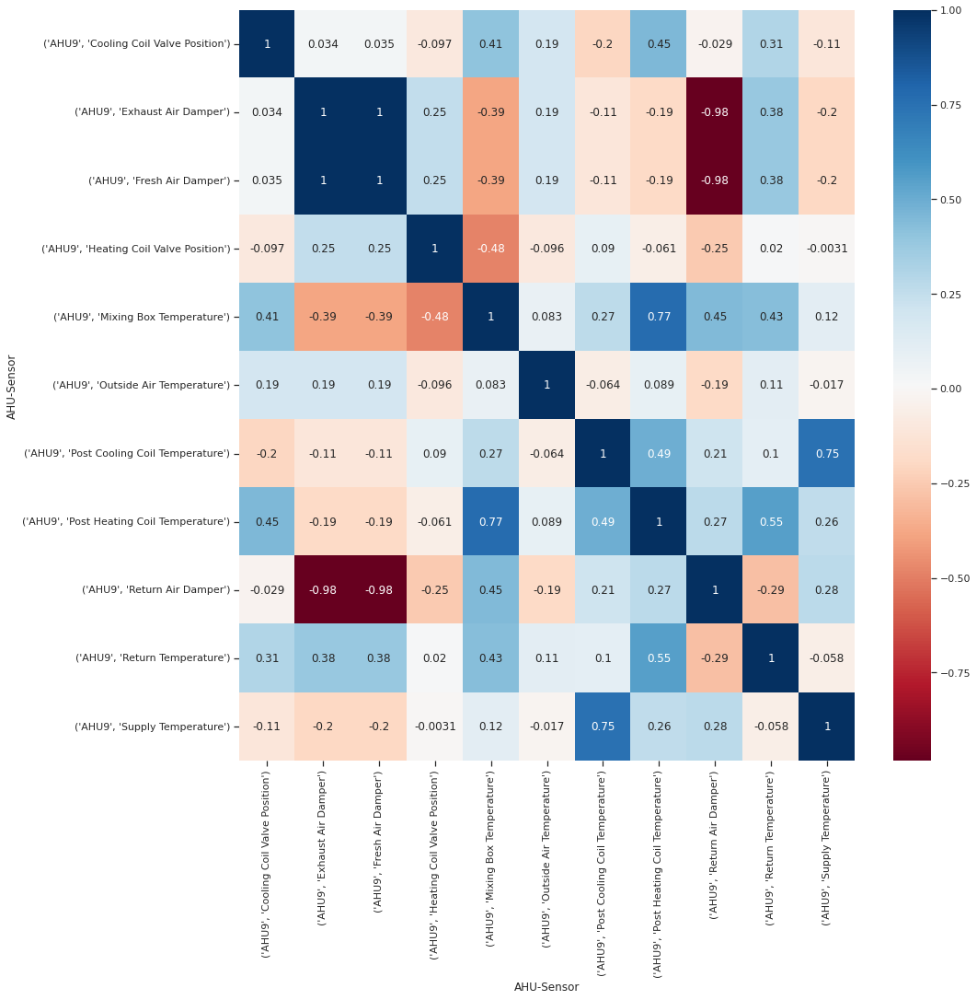

In [ ]:
corr = test_data.corr()
fig, ax = plt.subplots(figsize=(15,15)) 
sns.heatmap(corr, xticklabels = corr.columns, yticklabels=corr.columns, cmap = "RdBu", annot = True )

In [ ]:
#What % of data is missing for each sensor
total = test_data.isnull().sum().sort_values(ascending=False)
percent = (100* test_data.isnull().sum()/ test_data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(32)

Total    Percent
AHU  Sensor                                         
AHU9 Post Heating Coil Temperature  11530  10.027046
     Mixing Box Temperature         11324   9.847898
     Return Air Damper              11316   9.840941
     Post Cooling Coil Temperature  11244   9.778327
     Supply Temperature              8858   7.703346
     Cooling Coil Valve Position     8755   7.613772
     Heating Coil Valve Position     8680   7.548548
     Fresh Air Damper                8292   7.211125
     Return Temperature              8190   7.122420
     Exhaust Air Damper              8150   7.087634
     Outside Air Temperature         6171   5.366600

[Text(0, 0.5, 'Sensors')]

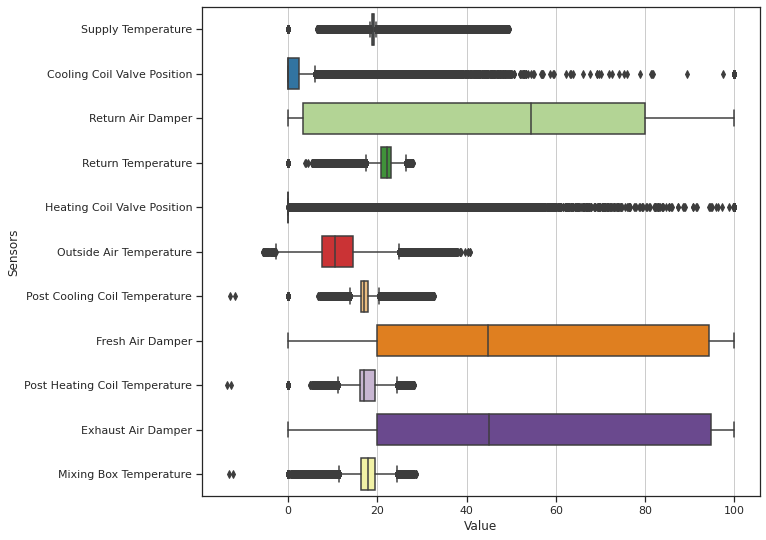

In [ ]:
#Boxplot - use seaborn library

import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(style="ticks")

# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(figsize=(10, 9))
ax.set_xscale("linear")

# Plot the orbital period with horizontal boxes
sns.boxplot(x="Value", y="Sensor", data=AHU9_data,
             width=.7, palette="Paired")

# Tweak the visual presentation
ax.xaxis.grid(True)
ax.set(ylabel="Sensors")

#can use to see if there's any unusal behavior in terms of the distribution

In [ ]:
AHU9_data1 = AHU9_data
AHU9_data1['Datetime'] = pd.to_datetime(AHU9_data['Datetime'])
AHU9_data1.set_index('Datetime', inplace=True)

In [ ]:
dg= AHU9_data1['Value'].resample('M').count().sort_values(ascending = False)


In [ ]:
dg.index = dg.index.strftime('%B, %Y')

In [ ]:
dg
#Used to see which month has the most amount of data missing

Datetime
January, 2018      32647
April, 2020        32646
May, 2019          32642
July, 2020         32640
May, 2020          32640
August, 2019       32549
January, 2019      32544
March, 2020        32538
January, 2020      32448
October, 2018      32365
December, 2017     32103
August, 2020       31974
August, 2017       31863
September, 2020    31690
September, 2017    31679
April, 2019        31620
March, 2019        31545
June, 2019         31489
December, 2019     31488
April, 2018        31430
September, 2018    31395
November, 2018     31392
June, 2020         31391
December, 2018     31316
July, 2019         30528
August, 2018       30480
October, 2019      30395
February, 2020     30336
July, 2018         29717
February, 2019     29568
September, 2019    28798
November, 2019     28481
February, 2018     26325
March, 2018        24212
July, 2017         23842
November, 2017     23001
May, 2018          22979
October, 2017      21742
October, 2020      17144
June, 2017      

#Section 3 : Exploratory Data Analysis

In [ ]:
#Exloratory Data Analysis on assigned months (statistical attributes, visualization, etc.)
#Briefly dexcribe your finding of EDA on the Assigned Months
#Support your findings with necessary figures and numerical metrics obtained from you EDA Analysis

In [312]:
#Preparing data for my months
#Read in All sensors cleaned data file
df = pd.read_csv(r"/content/gdrive/MyDrive/Assignment 3/Data and Scripts/Dataset/ATU9_Clean.csv",engine='python', error_bad_lines=False, parse_dates=[0],index_col=0)
#Display first five values of cvs file
df.head()

,Datetime,Value,Sensor,AHU,Unit
0,2017-06-24 19:45:00,19.43,Supply Temperature,AHU9,°C
1,2017-06-24 20:00:00,18.94,Supply Temperature,AHU9,°C
2,2017-06-24 20:15:00,18.88,Supply Temperature,AHU9,°C
3,2017-06-24 20:30:00,19.17,Supply Temperature,AHU9,°C
4,2017-06-24 20:45:00,18.74,Supply Temperature,AHU9,°C


In [313]:
#Change dataframe to just show  type of AHU, sensor and the value of the sensor
df = df[["Datetime","AHU","Sensor","Value"]]
#display new dataframe
df

,Datetime,AHU,Sensor,Value
0,2017-06-24 19:45:00,AHU9,Supply Temperature,19.43
1,2017-06-24 20:00:00,AHU9,Supply Temperature,18.94
2,2017-06-24 20:15:00,AHU9,Supply Temperature,18.88
3,2017-06-24 20:30:00,AHU9,Supply Temperature,19.17
4,2017-06-24 20:45:00,AHU9,Supply Temperature,18.74
...,...,...,...,...
1173622,2020-10-20 10:30:00,AHU9,Mixing Box Temperature,14.54
1173623,2020-10-20 10:45:00,AHU9,Mixing Box Temperature,14.56
1173624,2020-10-20 11:00:00,AHU9,Mixing Box Temperature,14.61
1173625,2020-10-20 11:15:00,AHU9,Mixing Box Temperature,14.25


In [314]:
df['Monthly'] = pd.to_datetime(df["Datetime"])
df['Monthly'] = df['Monthly'].dt.strftime('%b %Y')

df

,Datetime,AHU,Sensor,Value,Monthly
0,2017-06-24 19:45:00,AHU9,Supply Temperature,19.43,Jun 2017
1,2017-06-24 20:00:00,AHU9,Supply Temperature,18.94,Jun 2017
2,2017-06-24 20:15:00,AHU9,Supply Temperature,18.88,Jun 2017
3,2017-06-24 20:30:00,AHU9,Supply Temperature,19.17,Jun 2017
4,2017-06-24 20:45:00,AHU9,Supply Temperature,18.74,Jun 2017
...,...,...,...,...,...
1173622,2020-10-20 10:30:00,AHU9,Mixing Box Temperature,14.54,Oct 2020
1173623,2020-10-20 10:45:00,AHU9,Mixing Box Temperature,14.56,Oct 2020
1173624,2020-10-20 11:00:00,AHU9,Mixing Box Temperature,14.61,Oct 2020
1173625,2020-10-20 11:15:00,AHU9,Mixing Box Temperature,14.25,Oct 2020


In [315]:
#Generating December 2018 Dataset
Categ = df.groupby("Monthly")

#Isolate the values of December 2018
Dec2018 = Categ.get_group("Dec 2018")

#Saving dataset
path_to_file = "/content/gdrive/MyDrive/Assignment 3/Data and Scripts/Dataset/Dec2018.csv"
df2.to_csv(path_to_file, encoding="utf-8")

Dec2018

,Datetime,AHU,Sensor,Value,Monthly
42673,2018-12-01 00:00:00,AHU9,Supply Temperature,31.42,Dec 2018
42674,2018-12-01 00:15:00,AHU9,Supply Temperature,33.78,Dec 2018
42675,2018-12-01 00:30:00,AHU9,Supply Temperature,35.26,Dec 2018
42676,2018-12-01 00:45:00,AHU9,Supply Temperature,36.75,Dec 2018
42677,2018-12-01 01:00:00,AHU9,Supply Temperature,37.97,Dec 2018
...,...,...,...,...,...
1112109,2018-12-31 22:45:00,AHU9,Mixing Box Temperature,15.90,Dec 2018
1112110,2018-12-31 23:00:00,AHU9,Mixing Box Temperature,15.27,Dec 2018
1112111,2018-12-31 23:15:00,AHU9,Mixing Box Temperature,15.30,Dec 2018
1112112,2018-12-31 23:30:00,AHU9,Mixing Box Temperature,16.01,Dec 2018


In [316]:
DecData= pd.pivot_table(Dec2018, index= ['Datetime'], columns='Sensor', values= "Value")
#View pivoted dataframe
DecData

Sensor,Cooling Coil Valve Position,Exhaust Air Damper,Fresh Air Damper,Heating Coil Valve Position,Mixing Box Temperature,Outside Air Temperature,Post Cooling Coil Temperature,Post Heating Coil Temperature,Return Air Damper,Return Temperature,Supply Temperature
Datetime,,,,,,,,,,,
2018-12-01 00:00:00,0.0,0.00,0.00,0.0,12.34,6.03,17.90,13.42,100.00,17.97,31.42
2018-12-01 00:15:00,0.0,0.00,0.00,0.0,11.88,5.91,17.85,12.87,100.00,18.04,33.78
2018-12-01 00:30:00,0.0,0.00,0.00,0.0,11.46,5.62,17.71,12.43,100.00,16.40,35.26
2018-12-01 00:45:00,0.0,0.00,0.00,0.0,11.03,5.72,17.65,12.05,100.00,14.45,36.75
2018-12-01 01:00:00,0.0,0.00,0.00,0.0,10.76,5.80,17.64,11.77,100.00,14.17,37.97
...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 22:45:00,0.0,42.45,42.45,0.0,15.90,9.57,15.26,15.06,57.55,22.26,18.84
2018-12-31 23:00:00,0.0,55.43,55.43,0.0,15.27,9.57,15.73,15.20,44.57,22.40,19.17
2018-12-31 23:15:00,0.0,55.63,55.63,0.0,15.30,9.45,15.77,15.33,44.37,22.40,19.13


In [317]:
DecData.describe()

Sensor,Cooling Coil Valve Position,Exhaust Air Damper,Fresh Air Damper,Heating Coil Valve Position,Mixing Box Temperature,Outside Air Temperature,Post Cooling Coil Temperature,Post Heating Coil Temperature,Return Air Damper,Return Temperature,Supply Temperature
count,2739.0,2835.000000,2835.000000,2834.0,2664.000000,2932.000000,2664.000000,2664.000000,2664.000000,2835.000000,2835.000000
mean,0.0,42.790102,42.790102,0.0,16.934876,8.635321,16.609670,15.729520,53.202665,19.792307,18.497799
std,0.0,13.870510,13.870510,0.0,3.517732,2.348067,3.316243,3.182229,14.837118,4.484630,4.507514
min,0.0,0.000000,0.000000,0.0,0.000000,0.230000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.0,40.370000,40.370000,0.0,17.220000,7.247500,16.490000,15.810000,48.557500,19.660000,18.930000
50%,0.0,45.810000,45.810000,0.0,17.930000,9.185000,17.520000,16.580000,53.070000,20.850000,19.000000
75%,0.0,50.435000,50.435000,0.0,18.290000,10.270000,17.860000,16.880000,58.572500,21.635000,19.070000
max,0.0,75.530000,75.530000,0.0,19.590000,13.800000,18.920000,17.840000,100.000000,22.960000,38.320000


In [318]:
#Count how many NaN values in December 2018
print("December 2018 missing values:")
DecData.isnull().sum()

December 2018 missing values:


Sensor
Cooling Coil Valve Position      237
Exhaust Air Damper               141
Fresh Air Damper                 141
Heating Coil Valve Position      142
Mixing Box Temperature           312
Outside Air Temperature           44
Post Cooling Coil Temperature    312
Post Heating Coil Temperature    312
Return Air Damper                312
Return Temperature               141
Supply Temperature               141
dtype: int64

In [319]:
#Seeing what % of the data is missing in the 2018 file
total = DecData.isnull().sum().sort_values(ascending=False)
percent = (100* DecData.isnull().sum()/ DecData.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

,Total,Percent
Sensor,,
Return Air Damper,312,10.483871
Post Heating Coil Temperature,312,10.483871
Post Cooling Coil Temperature,312,10.483871
Mixing Box Temperature,312,10.483871
Cooling Coil Valve Position,237,7.963710
Heating Coil Valve Position,142,4.771505
Supply Temperature,141,4.737903
Return Temperature,141,4.737903
Fresh Air Damper,141,4.737903


Text(0.5, 1.0, 'Percentage of Data Missing for Each Sensor: December 2018')

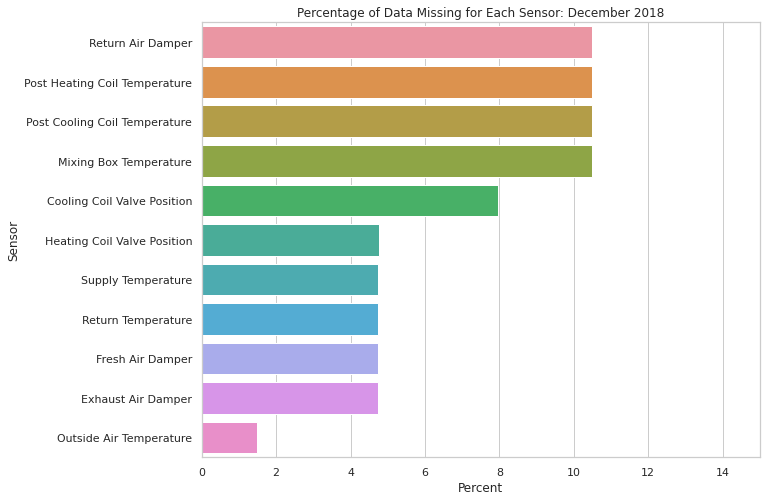

In [320]:
f, ax = plt.subplots(figsize=(10, 8))
sns.set_style("whitegrid")
sns.set_color_codes("pastel")
sns.barplot(x="Percent", y=missing_data.index, data=missing_data,
            label="Total")
ax.set(xlim=(0, 15))
plt.title("Percentage of Data Missing for Each Sensor: December 2018")

In [333]:
fig = px.line(Dec2018,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="December 2018: All Sensors" )
fig.show()

In [321]:
import plotly.express as px
ReturnAir=Dec2018[Dec2018.Sensor.str.contains('Return Air Damper',case=False)]
a=ReturnAir.loc[:,"Value"].median()
b=ReturnAir.loc[:,"Value"].mean()

fig = px.line(ReturnAir,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="December 2018 Return Air Damper" )
fig.add_hline(y = a, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="left top")
fig.add_hline(y = b, line_dash="dash", line_color="green", annotation_text="Mean", annotation_position = "left top")
fig.show()

In [322]:
PostH_temp=Dec2018[Dec2018.Sensor.str.contains('Post Heating Coil Temp',case=False)]
a=PostH_temp.loc[:,"Value"].median()
b=PostH_temp.loc[:,"Value"].mean()
fig = px.line(PostH_temp,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="December 2018 Post Heating Coil Temp" )
fig.add_hline(y = a, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="left top")
fig.add_hline(y = b, line_dash="dash", line_color="green", annotation_text="Mean", annotation_position = "left top")
fig.show()
#gaps in the data (missing values) - shown as sharp straight line
#how to compensate for missing data??

In [323]:
PostC_temp=Dec2018[Dec2018.Sensor.str.contains('Post Cooling Coil Temp',case=False)]
a=PostH_temp.loc[:,"Value"].median()
b=PostH_temp.loc[:,"Value"].mean()
fig = px.line(PostC_temp,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="December 2018 Post Cooling Coil Temp" )
fig.add_hline(y = a, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="left top")
fig.add_hline(y = b, line_dash="dash", line_color="green", annotation_text="Mean", annotation_position = "left top")
fig.show()

In [324]:
MB_temp=Dec2018[Dec2018.Sensor.str.contains('Mixing Box Temperature',case=False)]
a=MB_temp.loc[:,"Value"].median()
b=MB_temp.loc[:,"Value"].mean()

fig = px.line(MB_temp,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="December 2018 Mixing Box Temperature" )
fig.add_hline(y = a, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="left top")
fig.add_hline(y = b, line_dash="dash", line_color="green", annotation_text="Mean", annotation_position = "left top")
fig.show()

In [325]:
CCoil_Valve=Dec2018[Dec2018.Sensor.str.contains('Cooling Coil Valve Position',case=False)]
a=CCoil_Valve.loc[:,"Value"].median()
b=CCoil_Valve.loc[:,"Value"].mean()
fig = px.line(CCoil_Valve,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="December 2018 Cooling Coil Valve Position" )
fig.add_hline(y = a, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="left top")
fig.add_hline(y = b, line_dash="dash", line_color="green", annotation_text="Mean", annotation_position = "left top")
fig.show()

#Note the values are always at 0 as the cooling coil is never required in the month of December 
#The air is always too cold coming in for it to require cooling
#Therefore the missing values can easily be replaced with mean or median

In [326]:
HCoil_Valve=Dec2018[Dec2018.Sensor.str.contains('Heating Coil Valve Position',case=False)]
a=HCoil_Valve.loc[:,"Value"].median()
b=HCoil_Valve.loc[:,"Value"].mean()
fig = px.line(HCoil_Valve,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="December 2018 Heating Coil Valve Position" )
fig.add_hline(y = a, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="left top")
fig.add_hline(y = b, line_dash="dash", line_color="green", annotation_text="Mean", annotation_position = "left top")
fig.show()

In [327]:
Supply_Temp=Dec2018[Dec2018.Sensor.str.contains('Supply Temperature',case=False)]
a=Supply_Temp.loc[:,"Value"].median()
b=Supply_Temp.loc[:,"Value"].mean()
fig = px.line(Supply_Temp,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="December 2018 Supply Temperature" )
fig.add_hline(y = a, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="left top")
fig.add_hline(y = b, line_dash="dash", line_color="green", annotation_text="Mean", annotation_position = "left top")
fig.show()

In [328]:
Return_Temp=Dec2018[Dec2018.Sensor.str.contains('Return Temperature',case=False)]
a=Return_Temp.loc[:,"Value"].median()
b=Return_Temp.loc[:,"Value"].mean()
fig = px.line(Return_Temp,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="December 2018 Return Temperature" )
fig.add_hline(y = a, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="left top")
fig.add_hline(y = b, line_dash="dash", line_color="green", annotation_text="Mean", annotation_position = "left top")
fig.show()

In [329]:
FreshA_Temp=Dec2018[Dec2018.Sensor.str.contains('Fresh Air Damper',case=False)]
a=FreshA_Temp.loc[:,"Value"].median()
b=FreshA_Temp.loc[:,"Value"].mean()
fig = px.line(FreshA_Temp,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="December 2018 Fresh Air Damper" )
fig.add_hline(y = a, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="left top")
fig.add_hline(y = b, line_dash="dash", line_color="green", annotation_text="Mean", annotation_position = "left top")
fig.show()

In [330]:
ExhaustA_Temp=Dec2018[Dec2018.Sensor.str.contains('Exhaust Air Damper',case=False)]
a=ExhaustA_Temp.loc[:,"Value"].median()
b=ExhaustA_Temp.loc[:,"Value"].mean()
fig = px.line(ExhaustA_Temp,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="December 2018 Exhaust Air Damper" )
fig.add_hline(y = a, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="left top")
fig.add_hline(y = b, line_dash="dash", line_color="green", annotation_text="Mean", annotation_position = "left top")
fig.show()

In [331]:
OutA_Temp=Dec2018[Dec2018.Sensor.str.contains('Outside Air Temperature',case=False)]
a=OutA_Temp.loc[:,"Value"].median()
b=OutA_Temp.loc[:,"Value"].mean()
fig = px.line(OutA_Temp,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="December 2018 Outisde Air Temperature" )
fig.add_hline(y = a, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="left top")
fig.add_hline(y = b, line_dash="dash", line_color="green", annotation_text="Mean", annotation_position = "left top")
fig.show()

In [353]:
a=HCV.loc[:,"Value"].median()
b=HCV.loc[:,"Value"].mean()
fig = px.line(HCV,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="Heating Coil Valve Positions December Comparison" )

fig.add_vrect(x0="2017-12-01", x1="2017-12-31", 
              annotation_text="December 2017", annotation_position="top left",
              fillcolor="green", opacity=0.25, line_width=0)

fig.add_vrect(x0="2018-12-01", x1="2018-12-31", 
              annotation_text="December 2018", annotation_position="top left",
              fillcolor="green", opacity=0.25, line_width=0)

fig.add_vrect(x0="2019-12-01", x1="2019-12-31", 
              annotation_text="December 2019", annotation_position="top left",
              fillcolor="green", opacity=0.25, line_width=0)

fig.add_hline(y = a, line_dash="dash", line_color="red", annotation_text="Median", annotation_position="left top")
fig.add_hline(y = b, line_dash="dash", line_color="green", annotation_text="Mean", annotation_position = "left top")  

fig.show()

In [354]:
#Using DecData as you need to use wide format data
DecData['Return Air Damper'] = DecData['Return Air Damper'].fillna(value=DecData['Return Air Damper'].mean())
DecData['Post Cooling Coil Temperature'] = DecData['Post Cooling Coil Temperature'].fillna(value=DecData['Post Cooling Coil Temperature'].median())
DecData['Post Heating Coil Temperature'] = DecData['Post Heating Coil Temperature'].fillna(value=DecData['Post Heating Coil Temperature'].median())
DecData['Mixing Box Temperature'] = DecData['Mixing Box Temperature'].fillna(value=DecData['Mixing Box Temperature'].median ())
DecData['Cooling Coil Valve Position'] = DecData['Cooling Coil Valve Position'].fillna(value=DecData['Cooling Coil Valve Position'].median())
DecData['Heating Coil Valve Position'] = DecData['Heating Coil Valve Position'].fillna(value=DecData['Heating Coil Valve Position'].mean())
DecData['Supply Temperature'] = DecData['Supply Temperature'].fillna(value=DecData['Supply Temperature'].median())
DecData['Return Temperature'] = DecData['Return Temperature'].fillna(value=DecData['Return Temperature'].median())
DecData['Fresh Air Damper'] = DecData['Fresh Air Damper'].fillna(value=DecData['Fresh Air Damper'].mean())
DecData['Exhaust Air Damper'] = DecData['Exhaust Air Damper'].fillna(value=DecData['Exhaust Air Damper'].mean())
DecData['Outside Air Temperature'] = DecData['Outside Air Temperature'].fillna(value=DecData['Outside Air Temperature'].mean())

In [355]:
print("December 2018 missing values")
DecData.isnull().sum()

December 2018 missing values


Sensor
Cooling Coil Valve Position      0
Exhaust Air Damper               0
Fresh Air Damper                 0
Heating Coil Valve Position      0
Mixing Box Temperature           0
Outside Air Temperature          0
Post Cooling Coil Temperature    0
Post Heating Coil Temperature    0
Return Air Damper                0
Return Temperature               0
Supply Temperature               0
dtype: int64

In [356]:
DecData

Sensor,Cooling Coil Valve Position,Exhaust Air Damper,Fresh Air Damper,Heating Coil Valve Position,Mixing Box Temperature,Outside Air Temperature,Post Cooling Coil Temperature,Post Heating Coil Temperature,Return Air Damper,Return Temperature,Supply Temperature
Datetime,,,,,,,,,,,
2018-12-01 00:00:00,0.0,0.00,0.00,0.0,12.34,6.03,17.90,13.42,100.00,17.97,31.42
2018-12-01 00:15:00,0.0,0.00,0.00,0.0,11.88,5.91,17.85,12.87,100.00,18.04,33.78
2018-12-01 00:30:00,0.0,0.00,0.00,0.0,11.46,5.62,17.71,12.43,100.00,16.40,35.26
2018-12-01 00:45:00,0.0,0.00,0.00,0.0,11.03,5.72,17.65,12.05,100.00,14.45,36.75
2018-12-01 01:00:00,0.0,0.00,0.00,0.0,10.76,5.80,17.64,11.77,100.00,14.17,37.97
...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 22:45:00,0.0,42.45,42.45,0.0,15.90,9.57,15.26,15.06,57.55,22.26,18.84
2018-12-31 23:00:00,0.0,55.43,55.43,0.0,15.27,9.57,15.73,15.20,44.57,22.40,19.17
2018-12-31 23:15:00,0.0,55.63,55.63,0.0,15.30,9.45,15.77,15.33,44.37,22.40,19.13


In [357]:
#Generating Dataset
Categ = df.groupby("Monthly")

#Isolate the values of August 2019
Aug2019 = Categ.get_group("Aug 2019")

#Saving dataset
path_to_file = "/content/gdrive/MyDrive/Assignment 3/Data and Scripts/Dataset/Aug2019.csv"
df2.to_csv(path_to_file, encoding="utf-8")

Aug2019

,Datetime,AHU,Sensor,Value,Monthly
65617,2019-08-01 00:00:00,AHU9,Supply Temperature,19.03,Aug 2019
65618,2019-08-01 00:15:00,AHU9,Supply Temperature,18.96,Aug 2019
65619,2019-08-01 00:30:00,AHU9,Supply Temperature,18.95,Aug 2019
65620,2019-08-01 00:45:00,AHU9,Supply Temperature,19.08,Aug 2019
65621,2019-08-01 01:00:00,AHU9,Supply Temperature,19.04,Aug 2019
...,...,...,...,...,...
1135149,2019-08-31 22:45:00,AHU9,Mixing Box Temperature,20.48,Aug 2019
1135150,2019-08-31 23:00:00,AHU9,Mixing Box Temperature,20.76,Aug 2019
1135151,2019-08-31 23:15:00,AHU9,Mixing Box Temperature,20.89,Aug 2019
1135152,2019-08-31 23:30:00,AHU9,Mixing Box Temperature,20.88,Aug 2019


In [358]:
AugData= pd.pivot_table(Aug2019, index= ['Datetime'], columns='Sensor', values= "Value")
#Storing the August Data as a wide data set
AugData

Sensor,Cooling Coil Valve Position,Exhaust Air Damper,Fresh Air Damper,Heating Coil Valve Position,Mixing Box Temperature,Outside Air Temperature,Post Cooling Coil Temperature,Post Heating Coil Temperature,Return Air Damper,Return Temperature,Supply Temperature
Datetime,,,,,,,,,,,
2019-08-01 00:00:00,10.49,100.0,100.0,0.0,18.41,10.60,16.71,17.92,0.0,17.89,19.03
2019-08-01 00:15:00,10.65,100.0,100.0,0.0,18.67,10.96,16.75,18.15,0.0,18.11,18.96
2019-08-01 00:30:00,10.05,100.0,100.0,0.0,18.68,11.16,16.69,18.16,0.0,18.09,18.95
2019-08-01 00:45:00,11.07,100.0,100.0,0.0,18.46,11.29,16.68,18.02,0.0,17.95,19.08
2019-08-01 01:00:00,10.51,100.0,100.0,0.0,18.55,11.56,16.67,18.04,0.0,17.98,19.04
...,...,...,...,...,...,...,...,...,...,...,...
2019-08-31 22:45:00,7.28,20.0,20.0,0.0,20.48,15.73,15.76,21.01,80.0,24.37,18.79
2019-08-31 23:00:00,11.87,20.0,20.0,0.0,20.76,15.68,15.88,21.13,80.0,24.22,19.10
2019-08-31 23:15:00,16.66,20.0,20.0,0.0,20.89,15.82,16.16,21.23,80.0,24.29,19.42


In [359]:
AugData.describe()

Sensor,Cooling Coil Valve Position,Exhaust Air Damper,Fresh Air Damper,Heating Coil Valve Position,Mixing Box Temperature,Outside Air Temperature,Post Cooling Coil Temperature,Post Heating Coil Temperature,Return Air Damper,Return Temperature,Supply Temperature
count,2951.000000,2951.000000,2951.000000,2951.000000,2952.000000,2837.000000,2952.000000,2952.000000,2951.000000,2951.000000,2855.000000
mean,9.127679,23.928546,23.928546,0.320485,19.801186,16.007057,16.149590,19.991196,76.071454,21.937757,18.528711
std,6.927645,25.109205,25.109205,2.231490,3.491732,3.616834,1.358309,3.181617,25.109205,3.773158,1.904816
min,0.000000,0.000000,0.000000,0.000000,8.920000,7.710000,9.510000,9.290000,0.000000,9.140000,8.920000
25%,0.000000,20.000000,20.000000,0.000000,17.975000,13.690000,15.820000,18.480000,80.000000,22.630000,18.775000
50%,11.380000,20.000000,20.000000,0.000000,20.910000,15.500000,16.090000,21.220000,80.000000,23.580000,18.990000
75%,14.460000,20.000000,20.000000,0.000000,22.300000,18.040000,16.540000,22.230000,80.000000,24.050000,19.140000
max,39.720000,100.000000,100.000000,30.310000,24.760000,33.690000,21.870000,24.360000,100.000000,25.640000,24.430000


In [360]:
print("August 2019 missing values:")
AugData.isnull().sum()

August 2019 missing values:


Sensor
Cooling Coil Valve Position       25
Exhaust Air Damper                25
Fresh Air Damper                  25
Heating Coil Valve Position       25
Mixing Box Temperature            24
Outside Air Temperature          139
Post Cooling Coil Temperature     24
Post Heating Coil Temperature     24
Return Air Damper                 25
Return Temperature                25
Supply Temperature               121
dtype: int64

In [361]:
#Seeing what % of the data is missing in the August 2019 file
total = AugData.isnull().sum().sort_values(ascending=False)
percent = (100* AugData.isnull().sum()/ AugData.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(32)

#From table, can initial detuct that the data is going to be reliable

,Total,Percent
Sensor,,
Outside Air Temperature,139,4.670699
Supply Temperature,121,4.065860
Return Temperature,25,0.840054
Return Air Damper,25,0.840054
Heating Coil Valve Position,25,0.840054
Fresh Air Damper,25,0.840054
Exhaust Air Damper,25,0.840054
Cooling Coil Valve Position,25,0.840054
Post Heating Coil Temperature,24,0.806452


Text(0.5, 1.0, 'Percentage of Data Missing for Each Sensor: August 2019')

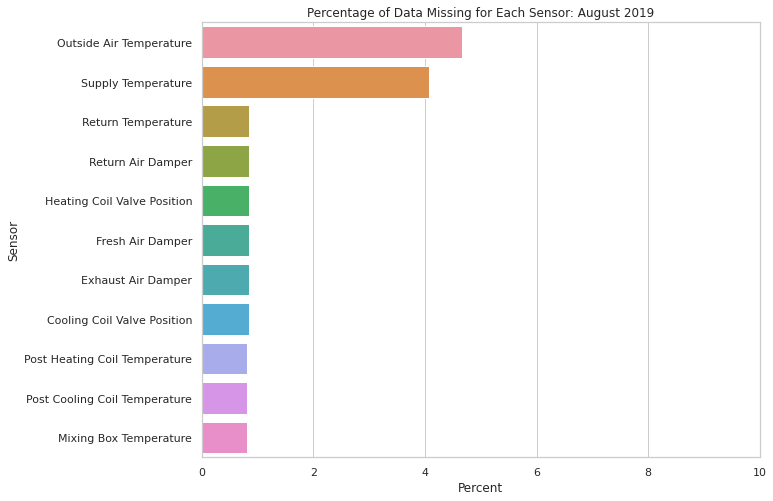

In [422]:
f, ax = plt.subplots(figsize=(10, 8))
sns.set_style("whitegrid")
sns.set_color_codes("pastel")
sns.barplot(x="Percent", y=missing_data.index, data=missing_data,
            label="Total")
ax.set(xlim=(0, 10))
plt.title("Percentage of Data Missing for Each Sensor: August 2019")

In [423]:
fig = px.line(Aug2019,x="Datetime", y="Value", color = "Sensor",
                 labels={
                     "x": "Datetime",
                     "y": "Value",
                     "color": "T"
                 },
                 title="August 2019: All Sensors" )
fig.show()

In [362]:
#Using AugData as you need to use wide format data
AugData['Return Air Damper'] = AugData['Return Air Damper'].fillna(value=AugData['Return Air Damper'].mean())
AugData['Post Cooling Coil Temperature'] = AugData['Post Cooling Coil Temperature'].fillna(value=AugData['Post Cooling Coil Temperature'].median())
AugData['Post Heating Coil Temperature'] = AugData['Post Heating Coil Temperature'].fillna(value=AugData['Post Heating Coil Temperature'].median())
AugData['Mixing Box Temperature'] = AugData['Mixing Box Temperature'].fillna(value=AugData['Mixing Box Temperature'].median ())
AugData['Cooling Coil Valve Position'] = AugData['Cooling Coil Valve Position'].fillna(value=AugData['Cooling Coil Valve Position'].median())
AugData['Heating Coil Valve Position'] = AugData['Heating Coil Valve Position'].fillna(value=AugData['Heating Coil Valve Position'].mean())
AugData['Supply Temperature'] = AugData['Supply Temperature'].fillna(value=AugData['Supply Temperature'].median())
AugData['Return Temperature'] = AugData['Return Temperature'].fillna(value=AugData['Return Temperature'].median())
AugData['Fresh Air Damper'] = AugData['Fresh Air Damper'].fillna(value=AugData['Fresh Air Damper'].mean())
AugData['Exhaust Air Damper'] = AugData['Exhaust Air Damper'].fillna(value=AugData['Exhaust Air Damper'].mean())
AugData['Outside Air Temperature'] = AugData['Outside Air Temperature'].fillna(value=AugData['Outside Air Temperature'].mean())

In [363]:
print("August 2019 missing values")
AugData.isnull().sum()

August 2019 missing values


Sensor
Cooling Coil Valve Position      0
Exhaust Air Damper               0
Fresh Air Damper                 0
Heating Coil Valve Position      0
Mixing Box Temperature           0
Outside Air Temperature          0
Post Cooling Coil Temperature    0
Post Heating Coil Temperature    0
Return Air Damper                0
Return Temperature               0
Supply Temperature               0
dtype: int64

#Section 4 : APAR Rule Modelling 

In [364]:
e_t = 1 # Error threshold for temperature sensors
e_hc = 0.1 # Error threshold for heating coil
e_cc = 0.1 # Error threshold for cooling coil
e_d = 0.3 # Error threshold for damper
MTmax = 2 # Max number of mode transitions per hour

**Virtual Month// Used for testing rules**

In [365]:
data = pd.read_csv(r"/content/gdrive/MyDrive/Assignment 3/AHU 9 Virtual Month_for students_Rev 3.csv",engine='python',index_col=0,error_bad_lines=False,encoding = 'cp1252', header = 0,usecols = [0,1,2,3,4,5,6,7,8,9,10])
#Note usecols 0-10 as there was 1 random value in row 11 of the csv file
data

,Cooling Coil Valve Position,Exhaust Air Damper,Heating Coil Valve Position,Outside Air Temperature,Return Air Damper,Return Temperature,Supply Temperature,Mixing box Temperature,Post Heating Coil Temperature,Cool Coil Temperature
Datetime,,,,,,,,,,
01/09/2020 00:00,0.0,99.97,0.0,11.28,0.03,22.45,19.03,17.00,16.58,16.81
01/09/2020 00:15,0.0,97.75,0.0,11.06,2.25,22.44,18.89,17.25,16.94,16.61
01/09/2020 00:30,0.0,96.78,0.0,10.94,3.22,22.43,18.79,17.01,16.61,16.51
01/09/2020 00:45,0.0,94.65,0.0,10.88,5.35,22.49,18.64,16.71,16.34,16.38
01/09/2020 01:00,0.0,91.46,0.0,10.82,8.54,22.41,18.79,16.43,15.97,16.67
...,...,...,...,...,...,...,...,...,...,...
01/10/2020 01:44,0.0,80.94,0.0,8.15,19.06,22.17,18.73,16.11,15.86,16.57
01/10/2020 01:59,0.0,63.77,0.0,8.33,36.23,22.09,18.74,15.98,15.71,16.24
01/10/2020 02:14,0.0,62.47,0.0,8.38,37.53,22.12,18.88,15.99,15.73,16.39


In [366]:
data.describe()

,Cooling Coil Valve Position,Exhaust Air Damper,Heating Coil Valve Position,Outside Air Temperature,Return Air Damper,Return Temperature,Supply Temperature,Mixing box Temperature,Post Heating Coil Temperature,Cool Coil Temperature
count,2892.000000,2892.000000,2892.000000,2885.000000,2892.000000,2892.000000,2892.000000,2888.000000,2888.000000,2888.000000
mean,1.543997,50.970273,0.805463,12.364153,48.947825,21.436625,19.057880,17.549395,16.875679,17.487043
std,9.444061,27.872841,7.470688,3.788282,27.859533,1.774151,0.943372,1.593175,1.391917,1.192944
min,0.000000,0.000000,0.000000,-3.120000,-2.500000,2.120000,15.110000,13.980000,13.660000,14.560000
25%,0.000000,40.160000,0.000000,10.600000,33.540000,21.020000,18.900000,16.250000,15.880000,16.500000
50%,0.000000,49.780000,0.000000,12.400000,50.170000,21.450000,19.010000,17.280000,16.690000,17.330000
75%,0.000000,66.400000,0.000000,13.740000,59.790000,21.960000,19.142500,18.640000,17.510000,18.440000
max,100.000000,100.000000,100.000000,100.000000,100.000000,80.000000,25.230000,24.980000,22.580000,22.450000


In [367]:
data.isnull().sum()

Cooling Coil Valve Position      0
Exhaust Air Damper               0
Heating Coil Valve Position      0
Outside Air Temperature          7
Return Air Damper                0
Return Temperature               0
Supply Temperature               0
Mixing box Temperature           4
Post Heating Coil Temperature    4
Cool Coil Temperature            4
dtype: int64

In [368]:
data['Outside Air Temperature'] = data['Outside Air Temperature'].fillna(value=data['Outside Air Temperature'].mean())
data['Mixing box Temperature'] = data['Mixing box Temperature'].fillna(value=data['Mixing box Temperature'].mean())
data['Post Heating Coil Temperature'] = data['Post Heating Coil Temperature'].fillna(value=data['Post Heating Coil Temperature'].mean())
data['Cool Coil Temperature '] = data['Cool Coil Temperature '].fillna(value=data['Cool Coil Temperature '].median()) #note extra space added after temperature to match what was in the csv file

In [369]:
data.isnull().sum()

Cooling Coil Valve Position      0
Exhaust Air Damper               0
Heating Coil Valve Position      0
Outside Air Temperature          0
Return Air Damper                0
Return Temperature               0
Supply Temperature               0
Mixing box Temperature           0
Post Heating Coil Temperature    0
Cool Coil Temperature            0
dtype: int64

In [370]:
data

,Cooling Coil Valve Position,Exhaust Air Damper,Heating Coil Valve Position,Outside Air Temperature,Return Air Damper,Return Temperature,Supply Temperature,Mixing box Temperature,Post Heating Coil Temperature,Cool Coil Temperature
Datetime,,,,,,,,,,
01/09/2020 00:00,0.0,99.97,0.0,11.28,0.03,22.45,19.03,17.00,16.58,16.81
01/09/2020 00:15,0.0,97.75,0.0,11.06,2.25,22.44,18.89,17.25,16.94,16.61
01/09/2020 00:30,0.0,96.78,0.0,10.94,3.22,22.43,18.79,17.01,16.61,16.51
01/09/2020 00:45,0.0,94.65,0.0,10.88,5.35,22.49,18.64,16.71,16.34,16.38
01/09/2020 01:00,0.0,91.46,0.0,10.82,8.54,22.41,18.79,16.43,15.97,16.67
...,...,...,...,...,...,...,...,...,...,...
01/10/2020 01:44,0.0,80.94,0.0,8.15,19.06,22.17,18.73,16.11,15.86,16.57
01/10/2020 01:59,0.0,63.77,0.0,8.33,36.23,22.09,18.74,15.98,15.71,16.24
01/10/2020 02:14,0.0,62.47,0.0,8.38,37.53,22.12,18.88,15.99,15.73,16.39


In [371]:
def label_mode (row):
    if (row['Cooling Coil Valve Position'] == 0) and row['Heating Coil Valve Position'] > 0 :
      return 1
    if (row['Cooling Coil Valve Position'] == 0) and row['Heating Coil Valve Position'] == 0 :
      return 2
    if (row['Exhaust Air Damper'] > 80) and row['Heating Coil Valve Position'] == 0 :
      return 3
    if (row['Cooling Coil Valve Position'] > 0 ) and row['Heating Coil Valve Position'] == 0 :
      return 4     
    return 5
data['Mode']=data.apply(lambda row: label_mode(row), axis=1)

In [372]:
Mode_name=list(data["Mode"].value_counts().index)
Mode_name.sort()
Mode_name

[1, 2, 3, 4, 5]

In [373]:
#Rule 28 prep
data["Mode_Shif"] = data['Mode'].shift(1).fillna(0)
data['Mode Change'] = abs(data['Mode'] - data['Mode_Shif'])
data["Total Mode Change"]=data['Mode Change'].rolling(4, min_periods=0).sum()

In [374]:
#Rule 28
MTmax = 2

def Mode_change (row):
    if row['Mode'] <= 5 and row["Total Mode Change"] > MTmax:
      return 1
    return 0

data["Rule_28"] = data.apply (lambda row: Mode_change(row), axis=1)

r28 = data.groupby("Rule_28")
Fail= r28.get_group(1)
V28 = Fail.Rule_28.count()


In [375]:
e_t = -1 # Threshold for errors in temperature measurements
e_hc = 0.1 # Threshold parameter for the heating coil valve control signal
e_cc = 0.1 # Threshold parameter for the cooling coil valve control signal
e_d = 0.3 # Threshold parameter for the mixing box damper valve control signal ed changed to 0.3???

#Error threshold - Look at Dominics lectures, lower is better

In [376]:
#Rule 4
def label_4 (row):
    if row['Mode'] == 1 and abs((row["Heating Coil Valve Position"]/100)-1) <= e_hc:
      return 1
    return 0

data["Rule_4"] = data.apply (lambda row: label_4(row), axis=1)

In [377]:
r4 = data.groupby("Rule_4")
Fail= r4.get_group(1)
Fail.head()

,Cooling Coil Valve Position,Exhaust Air Damper,Heating Coil Valve Position,Outside Air Temperature,Return Air Damper,Return Temperature,Supply Temperature,Mixing box Temperature,Post Heating Coil Temperature,Cool Coil Temperature,Mode,Mode_Shif,Mode Change,Total Mode Change,Rule_28,Rule_4
Datetime,,,,,,,,,,,,,,,,
12/09/2020 07:59,0.0,20.0,100.0,-2.5,80.0,22.45,17.90,17.46,17.46,17.46,1,2.0,1.0,1.0,0,1
12/09/2020 08:29,0.0,20.0,100.0,-2.5,80.0,22.45,17.90,17.46,17.46,17.46,1,2.0,1.0,3.0,1,1
12/09/2020 09:59,0.0,20.0,100.0,-2.5,80.0,22.45,19.03,17.46,18.20,18.20,1,2.0,1.0,1.0,0,1
12/09/2020 13:29,0.0,20.0,100.0,-2.5,80.0,22.45,19.03,17.46,18.20,18.20,1,2.0,1.0,1.0,0,1
16/09/2020 10:29,0.0,20.0,100.0,-2.5,80.0,22.45,19.03,17.46,18.20,18.20,1,2.0,1.0,1.0,0,1


In [378]:
V4 = Fail.Rule_4.count()
V4

14

In [379]:
#Rule 7
def label_7 (row):
    if row['Mode'] == 2 and abs(row['Supply Temperature']- (row["Supply Temperature"]-row['Cool Coil Temperature ']) - row['Mixing box Temperature']) > e_t:
      return 1
    return 0

data["Rule_7"] = data.apply (lambda row: label_7(row), axis=1)

In [380]:
r7 = data.groupby("Rule_7")
Fail= r7.get_group(1)
Fail.head()

,Cooling Coil Valve Position,Exhaust Air Damper,Heating Coil Valve Position,Outside Air Temperature,Return Air Damper,Return Temperature,Supply Temperature,Mixing box Temperature,Post Heating Coil Temperature,Cool Coil Temperature,Mode,Mode_Shif,Mode Change,Total Mode Change,Rule_28,Rule_4,Rule_7
Datetime,,,,,,,,,,,,,,,,,
01/09/2020 00:00,0.0,99.97,0.0,11.28,0.03,22.45,19.03,17.00,16.58,16.81,2,0.0,2.0,2.0,0,0,1
01/09/2020 00:15,0.0,97.75,0.0,11.06,2.25,22.44,18.89,17.25,16.94,16.61,2,2.0,0.0,2.0,0,0,1
01/09/2020 00:30,0.0,96.78,0.0,10.94,3.22,22.43,18.79,17.01,16.61,16.51,2,2.0,0.0,2.0,0,0,1
01/09/2020 00:45,0.0,94.65,0.0,10.88,5.35,22.49,18.64,16.71,16.34,16.38,2,2.0,0.0,2.0,0,0,1
01/09/2020 01:00,0.0,91.46,0.0,10.82,8.54,22.41,18.79,16.43,15.97,16.67,2,2.0,0.0,0.0,0,0,1


In [381]:
V7 = Fail.Rule_7.count()
V7

2679

In [382]:
#Rule 22
def label_22 (row):
    if row['Mode'] == 5 and (row["Heating Coil Valve Position"]/100)> e_hc and (row["Cooling Coil Valve Position"]/100) > e_cc:
      return 1
    return 0

data["Rule_22"] = data.apply (lambda row: label_22(row), axis=1)

In [383]:
r22 = data.groupby("Rule_22")
Fail= r22.get_group(1)
Fail.head()

,Cooling Coil Valve Position,Exhaust Air Damper,Heating Coil Valve Position,Outside Air Temperature,Return Air Damper,Return Temperature,Supply Temperature,Mixing box Temperature,Post Heating Coil Temperature,Cool Coil Temperature,Mode,Mode_Shif,Mode Change,Total Mode Change,Rule_28,Rule_4,Rule_7,Rule_22
Datetime,,,,,,,,,,,,,,,,,,
13/09/2020 19:59,25.0,20.0,30.0,12.4,80.00,22.49,19.03,18.454,18.51,18.56,5,2.0,3.0,3.0,1,0,0,1
21/09/2020 15:29,20.0,40.0,30.0,12.4,60.00,22.49,19.03,18.454,18.51,18.56,5,2.0,3.0,3.0,1,0,0,1
22/09/2020 04:44,25.0,20.0,30.0,12.4,80.00,22.49,19.03,18.454,18.51,18.56,5,2.0,3.0,3.0,1,0,0,1
24/09/2020 05:29,20.0,40.0,30.0,12.4,60.00,22.49,19.03,18.454,18.51,18.56,5,2.0,3.0,3.0,1,0,0,1
24/09/2020 10:14,20.0,0.0,19.4,80.0,22.14,18.95,22.42,22.450,18.30,18.87,5,2.0,3.0,3.0,1,0,0,1


In [384]:
V22 = Fail.Rule_22.count()
V22

10

In [385]:
#Rule 25
def label_25 (row):
    if row['Mode'] <= 5 and abs(row["Supply Temperature"]- data["Supply Temperature"].mean()) > e_t:
      return 1
    return 0

data["Rule_25"] = data.apply (lambda row: label_25(row), axis=1)

r25 = data.groupby("Rule_25")
Fail= r25.get_group(1)
V25 = Fail.Rule_25.count()

In [386]:
#Rule 26 
def label_26 (row):
    if row['Mode'] <= 5 and row["Mixing box Temperature"] < ((min(row["Return Temperature"], row["Outside Air Temperature"])) - e_t):
      return 1
    return 0

data["Rule_26"] = data.apply (lambda row: label_26(row), axis=1)

r26 = data.groupby("Rule_26")
Fail= r26.get_group(1)
V26 = Fail.Rule_26.count()

In [387]:
#Rule 27
def label_27 (row):
    if row['Mode'] <= 5 and row["Mixing box Temperature"] > ((max(row["Return Temperature"], row["Outside Air Temperature"])) + e_t):
      return 1
    return 0

data["Rule_27"] = data.apply (lambda row: label_27(row), axis=1)

r27 = data.groupby("Rule_27")
Fail= r27.get_group(1)
V27 = Fail.Rule_27.count()

In [388]:
dataf = [{'Rule_4': V4,'Rule_7':V7, 'Rule_22': V22,'Rule_25': V25,'Rule_26': V26,'Rule_27': V27,'Rule_28': V28, }]
dframe = pd.DataFrame(dataf, index =['Virtual'])  
dframe

,Rule_4,Rule_7,Rule_22,Rule_25,Rule_26,Rule_27,Rule_28
Virtual,14,2679,10,2892,144,79,189


In [390]:
import seaborn as sns
import matplotlib.pyplot as plt
rules = ['Rule_4','Rule_7', 'Rule_22','Rule_25','Rule_26','Rule_27','Rule_28']
data = [V4, V7, V22, V25, V26, V27, V28]


import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Bar(
    x=rules,
    y=data,
    name='Virtual month',
    marker_color='indianred'
))


# Here we modify the tickangle of the xaxis, resulting in rotated labels.
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()

**December 2018**

In [394]:
def label_mode (row):
    if (row['Cooling Coil Valve Position'] == 0) and row['Heating Coil Valve Position'] > 0 :
      return 1
    if (row['Cooling Coil Valve Position'] == 0) and row['Heating Coil Valve Position'] == 0 :
      return 2
    if (row['Exhaust Air Damper'] > 80) and row['Heating Coil Valve Position'] == 0 :
      return 3
    if (row['Cooling Coil Valve Position'] > 0 ) and row['Heating Coil Valve Position'] == 0 :
      return 4     
    return 5
DecData['Mode']=DecData.apply(lambda row: label_mode(row), axis=1)

In [395]:
Mode_name=list(DecData["Mode"].value_counts().index)
print('Modes present in December 2018 data:')
Mode_name
#As expected, the only mode applicable is Mode 2. 
#This is because the cooling coil and heating coil are both saying they're in the fully closed position for all Dec
#Rule 7 is my rule that is applicable for Mode 2
#Rules 25-28 are applicable for all occupied modes

Modes present in December 2018 data:


[2]

In [396]:
#Rule 7
def label_7 (row):
    if row['Mode'] == 2 and abs(row['Supply Temperature']- (row["Supply Temperature"]-row['Post Cooling Coil Temperature']) - row['Mixing Box Temperature']) > e_t:
      return 1
    return 0

DecData["Rule_7"] = DecData.apply (lambda row: label_7(row), axis=1)

In [397]:
#Graph of all the data sets with a 1 in Rule_7 column
r7 = DecData.groupby("Rule_7")
Fail= r7.get_group(1)
Fail

Sensor,Cooling Coil Valve Position,Exhaust Air Damper,Fresh Air Damper,Heating Coil Valve Position,Mixing Box Temperature,Outside Air Temperature,Post Cooling Coil Temperature,Post Heating Coil Temperature,Return Air Damper,Return Temperature,Supply Temperature,Mode,Rule_7
Datetime,,,,,,,,,,,,,
2018-12-01 00:00:00,0.0,0.00,0.00,0.0,12.34,6.03,17.90,13.42,100.00,17.97,31.42,2,1
2018-12-01 00:15:00,0.0,0.00,0.00,0.0,11.88,5.91,17.85,12.87,100.00,18.04,33.78,2,1
2018-12-01 00:30:00,0.0,0.00,0.00,0.0,11.46,5.62,17.71,12.43,100.00,16.40,35.26,2,1
2018-12-01 00:45:00,0.0,0.00,0.00,0.0,11.03,5.72,17.65,12.05,100.00,14.45,36.75,2,1
2018-12-01 01:00:00,0.0,0.00,0.00,0.0,10.76,5.80,17.64,11.77,100.00,14.17,37.97,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 22:45:00,0.0,42.45,42.45,0.0,15.90,9.57,15.26,15.06,57.55,22.26,18.84,2,1
2018-12-31 23:00:00,0.0,55.43,55.43,0.0,15.27,9.57,15.73,15.20,44.57,22.40,19.17,2,1
2018-12-31 23:15:00,0.0,55.63,55.63,0.0,15.30,9.45,15.77,15.33,44.37,22.40,19.13,2,1


In [398]:
D7 = Fail.Rule_7.count()
D7
#This means that rule 7 has applied to every single row in this dataset

2976

In [399]:
#Rule 25
def label_25 (row):
    if row['Mode'] <= 5 and abs(row["Supply Temperature"]- DecData["Supply Temperature"].mean()) > e_t:
      return 1
    return 0

DecData["Rule_25"] = DecData.apply (lambda row: label_25(row), axis=1)

r25 = DecData.groupby("Rule_25")
Fail= r25.get_group(1)
D25 = Fail.Rule_25.count()

In [400]:
#Rule 26 
def label_26 (row):
    if row['Mode'] <= 5 and row["Mixing Box Temperature"] < ((min(row["Return Temperature"], row["Outside Air Temperature"])) - e_t):
      return 1
    return 0

DecData["Rule_26"] = DecData.apply (lambda row: label_26(row), axis=1)

r26 = DecData.groupby("Rule_26")
Fail= r26.get_group(1)
D26 = Fail.Rule_26.count()

In [401]:
#Rule 27
def label_27 (row):
    if row['Mode'] <= 5 and row["Mixing Box Temperature"] > ((max(row["Return Temperature"], row["Outside Air Temperature"])) + e_t):
      return 1
    return 0

DecData["Rule_27"] = DecData.apply (lambda row: label_27(row), axis=1)

r27 = DecData.groupby("Rule_27")
Fail= r27.get_group(1)
D27 = Fail.Rule_27.count()

In [402]:
#Rule 28 prep
DecData["Mode_Shif"] = DecData['Mode'].shift(1).fillna(0)
DecData['Mode Change'] = abs(DecData['Mode'] - DecData['Mode_Shif'])
DecData["Total Mode Change"]=DecData['Mode Change'].rolling(4, min_periods=0).sum()

#Rule28
#Rule 28 measures the number of mode tranisitons per hour
#As we know December 2018 only has mode 2 data, this rule will always return 0

def Mode_change (row):
    if row['Mode'] <= 5 and row["Total Mode Change"] > MTmax:
      return 1
    return 0

DecData["Rule_28"] = DecData.apply (lambda row: Mode_change(row), axis=1)

#r28 = DecData.groupby("Rule_28")
#Fail= r28.get_group(1)
#D28 = Fail.Rule_28.count()
D28=0

#The above code produces an error when run which means that there is no instances of Rule 28 in the DecData

In [403]:
DecData

Sensor,Cooling Coil Valve Position,Exhaust Air Damper,Fresh Air Damper,Heating Coil Valve Position,Mixing Box Temperature,Outside Air Temperature,Post Cooling Coil Temperature,Post Heating Coil Temperature,Return Air Damper,Return Temperature,Supply Temperature,Mode,Rule_7,Rule_25,Rule_26,Rule_27,Mode_Shif,Mode Change,Total Mode Change,Rule_28
Datetime,,,,,,,,,,,,,,,,,,,,
2018-12-01 00:00:00,0.0,0.00,0.00,0.0,12.34,6.03,17.90,13.42,100.00,17.97,31.42,2,1,1,0,0,0.0,2.0,2.0,0
2018-12-01 00:15:00,0.0,0.00,0.00,0.0,11.88,5.91,17.85,12.87,100.00,18.04,33.78,2,1,1,0,0,2.0,0.0,2.0,0
2018-12-01 00:30:00,0.0,0.00,0.00,0.0,11.46,5.62,17.71,12.43,100.00,16.40,35.26,2,1,1,0,0,2.0,0.0,2.0,0
2018-12-01 00:45:00,0.0,0.00,0.00,0.0,11.03,5.72,17.65,12.05,100.00,14.45,36.75,2,1,1,0,0,2.0,0.0,2.0,0
2018-12-01 01:00:00,0.0,0.00,0.00,0.0,10.76,5.80,17.64,11.77,100.00,14.17,37.97,2,1,1,0,0,2.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 22:45:00,0.0,42.45,42.45,0.0,15.90,9.57,15.26,15.06,57.55,22.26,18.84,2,1,1,0,0,2.0,0.0,0.0,0
2018-12-31 23:00:00,0.0,55.43,55.43,0.0,15.27,9.57,15.73,15.20,44.57,22.40,19.17,2,1,1,0,0,2.0,0.0,0.0,0
2018-12-31 23:15:00,0.0,55.63,55.63,0.0,15.30,9.45,15.77,15.33,44.37,22.40,19.13,2,1,1,0,0,2.0,0.0,0.0,0


In [404]:
DecRulesdf = DecData[["Rule_7", "Rule_25", "Rule_26", "Rule_27", "Rule_28"]]
DecRulesdf

Sensor,Rule_7,Rule_25,Rule_26,Rule_27,Rule_28
Datetime,,,,,
2018-12-01 00:00:00,1,1,0,0,0
2018-12-01 00:15:00,1,1,0,0,0
2018-12-01 00:30:00,1,1,0,0,0
2018-12-01 00:45:00,1,1,0,0,0
2018-12-01 01:00:00,1,1,0,0,0
...,...,...,...,...,...
2018-12-31 22:45:00,1,1,0,0,0
2018-12-31 23:00:00,1,1,0,0,0
2018-12-31 23:15:00,1,1,0,0,0


In [405]:
D4 = 0 
D22 = 0

DecRulesData = [{'Rule_4': D4,'Rule_7':D7, 'Rule_22': D22,'Rule_25': D25,'Rule_26': D26,'Rule_27': D27,'Rule_28': D28, }]
dframe1 = pd.DataFrame(DecRulesData, index =['Winter'])  
dframe1

,Rule_4,Rule_7,Rule_22,Rule_25,Rule_26,Rule_27,Rule_28
Winter,0,2976,0,2976,93,106,0


**August 2019**

In [406]:
AugData

Sensor,Cooling Coil Valve Position,Exhaust Air Damper,Fresh Air Damper,Heating Coil Valve Position,Mixing Box Temperature,Outside Air Temperature,Post Cooling Coil Temperature,Post Heating Coil Temperature,Return Air Damper,Return Temperature,Supply Temperature
Datetime,,,,,,,,,,,
2019-08-01 00:00:00,10.49,100.0,100.0,0.0,18.41,10.60,16.71,17.92,0.0,17.89,19.03
2019-08-01 00:15:00,10.65,100.0,100.0,0.0,18.67,10.96,16.75,18.15,0.0,18.11,18.96
2019-08-01 00:30:00,10.05,100.0,100.0,0.0,18.68,11.16,16.69,18.16,0.0,18.09,18.95
2019-08-01 00:45:00,11.07,100.0,100.0,0.0,18.46,11.29,16.68,18.02,0.0,17.95,19.08
2019-08-01 01:00:00,10.51,100.0,100.0,0.0,18.55,11.56,16.67,18.04,0.0,17.98,19.04
...,...,...,...,...,...,...,...,...,...,...,...
2019-08-31 22:45:00,7.28,20.0,20.0,0.0,20.48,15.73,15.76,21.01,80.0,24.37,18.79
2019-08-31 23:00:00,11.87,20.0,20.0,0.0,20.76,15.68,15.88,21.13,80.0,24.22,19.10
2019-08-31 23:15:00,16.66,20.0,20.0,0.0,20.89,15.82,16.16,21.23,80.0,24.29,19.42


In [407]:
def label_mode (row):
    if (row['Cooling Coil Valve Position'] == 0) and row['Heating Coil Valve Position'] > 0 :
      return 1
    if (row['Cooling Coil Valve Position'] == 0) and row['Heating Coil Valve Position'] == 0 :
      return 2
    if (row['Exhaust Air Damper'] > 80) and row['Heating Coil Valve Position'] == 0 :
      return 3
    if (row['Cooling Coil Valve Position'] > 0 ) and row['Heating Coil Valve Position'] == 0 :
      return 4     
    return 5
AugData['Mode']=AugData.apply(lambda row: label_mode(row), axis=1)

In [408]:
Mode_name=list(AugData["Mode"].value_counts().index)
print('Modes present in August 2019 data:')
Mode_name.sort()
Mode_name
#all modes are present in this data set 
#My Rules are 4 (Mode 1), 7 (Mode 2) and 22 (Mode 4)

Modes present in August 2019 data:


[1, 2, 3, 4, 5]

In [409]:
#Rule 4
def label_4 (row):
    if row['Mode'] == 1 and abs((row["Heating Coil Valve Position"]/100)-1) <= e_hc:
      return 1
    return 0

AugData["Rule_4"] = AugData.apply (lambda row: label_4(row), axis=1)

In [410]:
#r4 = AugData.groupby("Rule_4")
#Fail= r4.get_group(1)
#A4 = Fail.Rule_4.count()
#r4.get_group(1) 

#This code returns an error which implies that there is data which satifies rule 4
A4 = 0

In [411]:
#Rule 7
def label_7 (row):
    if row['Mode'] == 2 and abs(row['Supply Temperature']- (row["Supply Temperature"]-row['Post Cooling Coil Temperature']) - row['Mixing Box Temperature']) > e_t:
      return 1
    return 0

AugData["Rule_7"] = AugData.apply (lambda row: label_7(row), axis=1)

r7 = AugData.groupby("Rule_7")
Fail= r7.get_group(1)
A7 = Fail.Rule_7.count()
A7

#Returned 758 rows out of 2976 possible rows

758

In [412]:
#Rule 22

def label_22 (row):
    if row['Mode'] == 5 and (row["Heating Coil Valve Position"]/100)> e_hc and (row["Cooling Coil Valve Position"]/100) > e_cc:
      return 1
    return 0

AugData["Rule_22"] = AugData.apply (lambda row: label_22(row), axis=1)

#r22 = AugData.groupby("Rule_22")
#Fail= r22.get_group(1)
#This code returned an error which implies that there is no data which satifies rule 22

A22 = 0 

In [413]:
#Rule 25
def label_25 (row):
    if row['Mode'] <= 5 and abs(row["Supply Temperature"]- AugData["Supply Temperature"].mean()) > e_t:
      return 1
    return 0

AugData["Rule_25"] = AugData.apply (lambda row: label_25(row), axis=1)

r25 = AugData.groupby("Rule_25")
Fail= r25.get_group(1)
A25 = Fail.Rule_25.count()

In [414]:
#Rule 26 
def label_26 (row):
    if row['Mode'] <= 5 and row["Mixing Box Temperature"] < ((min(row["Return Temperature"], row["Outside Air Temperature"])) - e_t):
      return 1
    return 0

AugData["Rule_26"] = AugData.apply (lambda row: label_26(row), axis=1)

r26 = AugData.groupby("Rule_26")
Fail= r26.get_group(1)
A26 = Fail.Rule_26.count()

In [415]:
#Rule 27
def label_27 (row):
    if row['Mode'] <= 5 and row["Mixing Box Temperature"] > ((max(row["Return Temperature"], row["Outside Air Temperature"])) + e_t):
      return 1
    return 0

AugData["Rule_27"] = AugData.apply (lambda row: label_27(row), axis=1)

r27 = AugData.groupby("Rule_26")
Fail= r27.get_group(1)
A27 = Fail.Rule_27.count()

In [416]:
#Rule 28 prep
AugData["Mode_Shif"] = AugData['Mode'].shift(1).fillna(0)
AugData['Mode Change'] = abs(AugData['Mode'] - AugData['Mode_Shif'])
AugData["Total Mode Change"]=AugData['Mode Change'].rolling(4, min_periods=0).sum()

#Rule28
#Rule 28 measures the number of mode tranisitons per hour

def Mode_change (row):
    if row['Mode'] <= 5 and row["Total Mode Change"] > MTmax:
      return 1
    return 0

AugData["Rule_28"] = AugData.apply (lambda row: Mode_change(row), axis=1)

r28 = AugData.groupby("Rule_28")
Fail= r28.get_group(1)
A28 = Fail.Rule_28.count()

In [417]:
AugData

Sensor,Cooling Coil Valve Position,Exhaust Air Damper,Fresh Air Damper,Heating Coil Valve Position,Mixing Box Temperature,Outside Air Temperature,Post Cooling Coil Temperature,Post Heating Coil Temperature,Return Air Damper,Return Temperature,Supply Temperature,Mode,Rule_4,Rule_7,Rule_22,Rule_25,Rule_26,Rule_27,Mode_Shif,Mode Change,Total Mode Change,Rule_28
Datetime,,,,,,,,,,,,,,,,,,,,,,
2019-08-01 00:00:00,10.49,100.0,100.0,0.0,18.41,10.60,16.71,17.92,0.0,17.89,19.03,3,0,0,0,1,0,1,0.0,3.0,3.0,1
2019-08-01 00:15:00,10.65,100.0,100.0,0.0,18.67,10.96,16.75,18.15,0.0,18.11,18.96,3,0,0,0,1,0,1,3.0,0.0,3.0,1
2019-08-01 00:30:00,10.05,100.0,100.0,0.0,18.68,11.16,16.69,18.16,0.0,18.09,18.95,3,0,0,0,1,0,1,3.0,0.0,3.0,1
2019-08-01 00:45:00,11.07,100.0,100.0,0.0,18.46,11.29,16.68,18.02,0.0,17.95,19.08,3,0,0,0,1,0,1,3.0,0.0,3.0,1
2019-08-01 01:00:00,10.51,100.0,100.0,0.0,18.55,11.56,16.67,18.04,0.0,17.98,19.04,3,0,0,0,1,0,1,3.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-31 22:45:00,7.28,20.0,20.0,0.0,20.48,15.73,15.76,21.01,80.0,24.37,18.79,4,0,0,0,1,0,0,4.0,0.0,0.0,0
2019-08-31 23:00:00,11.87,20.0,20.0,0.0,20.76,15.68,15.88,21.13,80.0,24.22,19.10,4,0,0,0,1,0,0,4.0,0.0,0.0,0
2019-08-31 23:15:00,16.66,20.0,20.0,0.0,20.89,15.82,16.16,21.23,80.0,24.29,19.42,4,0,0,0,1,0,0,4.0,0.0,0.0,0


In [418]:
AugRules = AugData[["Rule_4","Rule_7", "Rule_22","Rule_25", "Rule_26", "Rule_27", "Rule_28"]]
AugRules

Sensor,Rule_4,Rule_7,Rule_22,Rule_25,Rule_26,Rule_27,Rule_28
Datetime,,,,,,,
2019-08-01 00:00:00,0,0,0,1,0,1,1
2019-08-01 00:15:00,0,0,0,1,0,1,1
2019-08-01 00:30:00,0,0,0,1,0,1,1
2019-08-01 00:45:00,0,0,0,1,0,1,1
2019-08-01 01:00:00,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...
2019-08-31 22:45:00,0,0,0,1,0,0,0
2019-08-31 23:00:00,0,0,0,1,0,0,0
2019-08-31 23:15:00,0,0,0,1,0,0,0


In [419]:
AugRulesData = [{'Rule_4': A4,'Rule_7':A7, 'Rule_22': A22,'Rule_25': A25,'Rule_26': A26,'Rule_27': A27,'Rule_28': A28}]
dframe2 = pd.DataFrame(AugRulesData, index =['Summer'])  
dframe2

,Rule_4,Rule_7,Rule_22,Rule_25,Rule_26,Rule_27,Rule_28
Summer,0,758,0,2976,780,780,293


# Section 5 : Fault Visualization

In [420]:
import plotly.graph_objects as go

rules = ['Rule_4','Rule_7', 'Rule_22','Rule_25','Rule_26','Rule_27','Rule_28']

virtual = [V4, V7, V22, V25, V26, V27, V28]
winter= [D4, D7, D22, D25, D26, D27, D28]
summer = [A4, A7, A22, A25, A26, A27, A28]


fig = go.Figure()
fig.add_trace(go.Bar(
    x=rules,
    y=virtual,
    name='Virtual month',
    marker_color='indianred'
))

fig.add_trace(go.Bar(
    x=rules,
    y=winter,
    name='Winter Month',
    marker_color='lightsalmon'
))
fig.add_trace(go.Bar(
    x=rules,
    y=summer,
    name='Summer Month',
    marker_color='LightSkyBlue'
))


# Here we modify the tickangle of the xaxis, resulting in rotated labels.
fig.update_layout(barmode='group', xaxis_tickangle=-45)
fig.show()